<a href="https://colab.research.google.com/github/JhonaGo/Application-Research/blob/main/Empresas_BC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Censos Económicos: BC

In [ ]:
import pandas as pd

In [ ]:
ce_bc = pd.read_csv("/content/drive/MyDrive/Proyectos/pyme_bc/Censo_Economico/SAIC_BC_sector.csv")

# drop the first 3 rows
ce_bc = ce_bc.iloc[3:].copy()

# Set the correct column names based on the first row
ce_bc.columns = ce_bc.iloc[0]
ce_bc = ce_bc[1:].reset_index(drop=True)

# eliminate last column (assuming it's the unnamed index column after reset_index)
if 'Unnamed: 0' in ce_bc.columns:
    ce_bc = ce_bc.drop(columns=['Unnamed: 0'])
# Check for columns that are not strings and drop them if necessary
non_string_cols = [col for col in ce_bc.columns if not isinstance(col, str)]
if non_string_cols:
    # Assuming the last column might be the problematic one if it's not a string
    if ce_bc.columns[-1] in non_string_cols:
         ce_bc = ce_bc.iloc[:, :-1]
    else:
        # If there are other non-string columns, you might need a more specific way to handle them
        # For now, let's assume the last column is the most likely issue.
        pass


# large bound of data frame
ce_bc = ce_bc.iloc[:138].copy()

# Extract initial code from headers and rename columns
# Convert columns to strings before splitting
ce_bc.columns = ce_bc.columns.astype(str)
new_columns = [col.split(' ')[0] for col in ce_bc.columns]
ce_bc.columns = new_columns


ce_bc.head()

,Año,Entidad,Estrato,Actividad,Q000A,Q000B,Q000C,Q000D,UE,H001A,...,H101A,H010D,H010C,H010B,H000D,H000C,H000B,H001D,H001C,H001B
0,2023,02 Baja California,0 a 10,"Sector 11 Agricultura, cría y explotación de a...",346.485,39.630,2.205,0.461,149,662,...,464,145.824,87,427,177.768,121,537,177.768,123,539
1,2023,02 Baja California,11 a 50,"Sector 11 Agricultura, cría y explotación de a...",715.940,112.031,11.678,0.000,110,2771,...,2352,483.040,457,2142,483.040,498,2268,483.040,500,2271
2,2023,02 Baja California,51 a 250,"Sector 11 Agricultura, cría y explotación de a...",648.578,106.944,9.310,0.000,26,2328,...,2052,669.000,328,1977,669.000,345,1983,669.000,345,1983
3,2023,02 Baja California,251 y más,"Sector 11 Agricultura, cría y explotación de a...",1018.608,89.762,66.298,10.023,7,2497,...,2238,3066.000,716,1755,3074.000,717,1758,3114.000,720,1777
4,2023,02 Baja California,0 a 10,Sector 23 Construcción,447.250,37.488,16.778,18.190,295,1362,...,812,2183.472,213,868,2625.636,257,1067,2706.612,269,1093


In [ ]:
# omitir empresas mayores de 250 empleados
ce_bc = ce_bc[ce_bc['Estrato']!="251 y más"]

### QN1

**Cuántas unidades económicas existen por sector en cada uno de los estratos a nivel año**

In [ ]:
# unidades economicas
unidades = ce_bc.iloc[:, [2, 3, 8]].copy()

In [ ]:
# Select the relevant columns directly from ce_bc
unidades_estrato = ce_bc[['Año', 'Estrato', 'Actividad', 'UE']].copy()

# Convert 'UE' to numeric, coercing errors
unidades_estrato.loc[:, 'UE'] = pd.to_numeric(unidades_estrato['UE'], errors='coerce')

# Group by 'Año', 'Estrato', and 'Actividad' and sum 'UE'
unidades_por_sector_estrato_año = unidades_estrato.groupby(['Año', 'Estrato', 'Actividad'])['UE'].sum().reset_index()

# Display the result
display(unidades_por_sector_estrato_año)

,Año,Estrato,Actividad,UE
0,2013,0 a 10,Sector 31-33 Industrias manufactureras,5893
1,2013,0 a 10,Sector 43 Comercio al por mayor,2421
2,2013,0 a 10,Sector 46 Comercio al por menor,36692
3,2013,0 a 10,"Sector 48-49 Transportes, correos y almacenami...",529
4,2013,0 a 10,Sector 53 Servicios inmobiliarios y de alquile...,2074
...,...,...,...,...
100,2023,51 a 250,Sector 56 Servicios de apoyo a los negocios y ...,78
101,2023,51 a 250,Sector 61 Servicios educativos,79
102,2023,51 a 250,Sector 62 Servicios de salud y de asistencia s...,51
103,2023,51 a 250,Sector 72 Servicios de alojamiento temporal y ...,120


Text(0.5, 0.01, 'Fuente: CE, INEGI')

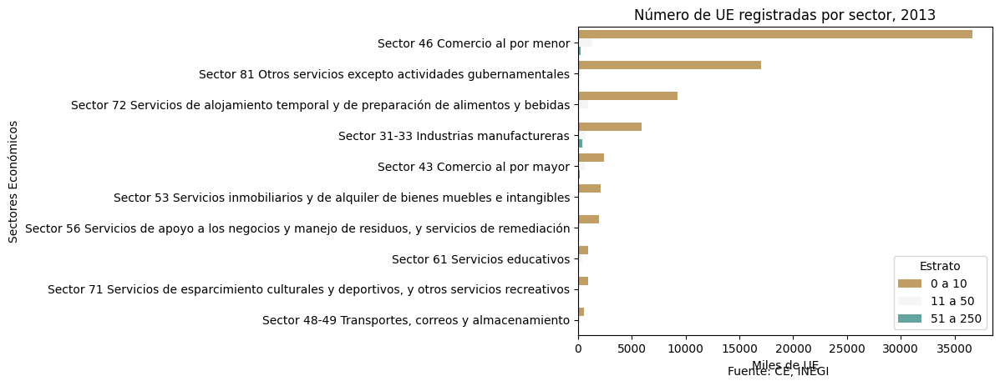

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# plot by year unidades_por_sector_estrato_año
unidades_trece = unidades_estrato[unidades_estrato['Año'] == "2013"]

# plot ascending
unidades_trece = unidades_trece.sort_values(by='UE', ascending=False)

# plot
sns.barplot(x='UE',
            y='Actividad',
            data= unidades_trece,
            palette='BrBG',
            hue='Estrato',
            legend=True)

# etiquetas
plt.xlabel('Miles de UE')
plt.ylabel('Sectores Económicos')
plt.title('Número de UE registradas por sector, 2013')
plt.figtext(0.5, 0.01, "Fuente: CE, INEGI", ha="center", fontsize=10)

Text(0.5, 0.01, 'Fuente: CE, INEGI')

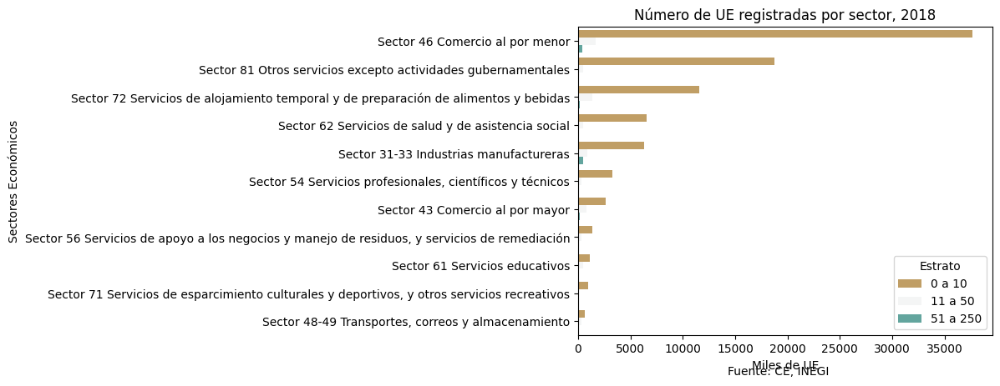

In [ ]:
# plot by year unidades_por_sector_estrato_año
unidades_diezocho = unidades_estrato[unidades_estrato['Año'] == "2018"]

# plot ascending
unidades_diezocho = unidades_diezocho.sort_values(by='UE', ascending=False)

# plot
sns.barplot(x='UE',
            y='Actividad',
            data= unidades_diezocho,
            palette='BrBG',
            hue='Estrato',
            legend=True)

# etiquetas
plt.xlabel('Miles de UE')
plt.ylabel('Sectores Económicos')
plt.title('Número de UE registradas por sector, 2018')
plt.figtext(0.5, 0.01, "Fuente: CE, INEGI", ha="center", fontsize=10)

Text(0.5, 0.01, 'Fuente: CE, INEGI')

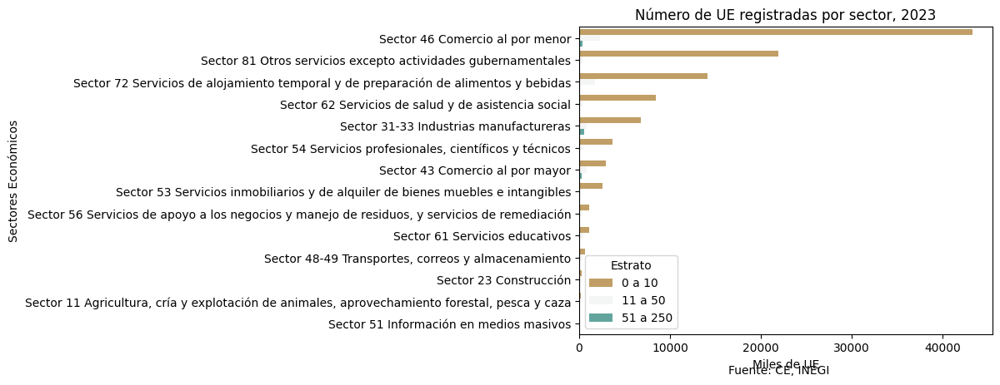

In [ ]:
# plot by year unidades_por_sector_estrato_año
unidades_veintres = unidades_estrato[unidades_estrato['Año'] == "2023"]

# plot ascending
unidades_veintres = unidades_veintres.sort_values(by='UE', ascending=False)

# plot
sns.barplot(x='UE',
            y='Actividad',
            data= unidades_veintres,
            palette='BrBG',
            hue='Estrato',
            legend=True)

# etiquetas
plt.xlabel('Miles de UE')
plt.ylabel('Sectores Económicos')
plt.title('Número de UE registradas por sector, 2023')
plt.figtext(0.5, 0.01, "Fuente: CE, INEGI", ha="center", fontsize=10)


Porcentajes de participación

In [ ]:
# market share
share_estrato = unidades_veintres.pivot_table(index=['Año', 'Estrato'],
                                             values='UE',
                                             aggfunc='sum',
                                             fill_value=0)

# percentaje
share_estrato['%'] = (share_estrato['UE']/share_estrato['UE'].sum())*100

share_estrato.round(2)

/tmp/ipython-input-1125221897.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  share_estrato = unidades_veintres.pivot_table(index=['Año', 'Estrato'],


UE      %
Año  Estrato                
2023 0 a 10    107288  91.11
     11 a 50     8609   7.31
     51 a 250    1861   1.58

In [ ]:
# UE share
share_actividades= unidades_veintres[unidades_veintres['Estrato']=="0 a 10"].pivot_table(index=['Año', 'Actividad'],
                                                                                          values='UE',
                                                                                          aggfunc='sum',
                                                                                          fill_value=0)
share_actividades['%'] = (share_actividades['UE']/share_actividades['UE'].sum())*100

# order ascending
share_actividades = share_actividades.sort_values(by='UE', ascending=False)

share_actividades.round(2)

/tmp/ipython-input-3339773551.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  share_actividades= unidades_veintres[unidades_veintres['Estrato']=="0 a 10"].pivot_table(index=['Año', 'Actividad'],


UE      %
Año  Actividad                                                       
2023 Sector 46 Comercio al por menor                     43341  40.40
     Sector 81 Otros servicios excepto actividades g...  21950  20.46
     Sector 72 Servicios de alojamiento temporal y d...  14115  13.16
     Sector 62 Servicios de salud y de asistencia so...   8489   7.91
     Sector 31-33 Industrias manufactureras               6782   6.32
     Sector 54 Servicios profesionales, científicos ...   3703   3.45
     Sector 43 Comercio al por mayor                      2914   2.72
     Sector 53 Servicios inmobiliarios y de alquiler...   2547   2.37
     Sector 56 Servicios de apoyo a los negocios y m...   1115   1.04
     Sector 61 Servicios educativos                       1090   1.02
     Sector 48-49 Transportes, correos y almacenamiento    675   0.63
     Sector 23 Construcción                                295   0.27
     Sector 11 Agricultura, cría y explotación de an...    149   0.14
     Sector 51 Información en medios masivos               123   0.11

### QN2

**De cuánto fue la variaciòn observada de UE
entre 2013 y 2023**

In [ ]:
# omit the middle year
ue_delta= unidades_estrato[unidades_estrato['Año'] != "2018"]

# transpose matrix
ue_delta = ue_delta.pivot_table(index=['Año', 'Estrato'],
                                columns='Actividad',
                                values='UE',
                                aggfunc='sum',
                                fill_value=0)
# reseat index with integer values
ue_delta=ue_delta.reset_index()
ue_delta

/tmp/ipython-input-2415269515.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ue_delta = ue_delta.pivot_table(index=['Año', 'Estrato'],


Actividad,Año,Estrato,"Sector 11 Agricultura, cría y explotación de animales, aprovechamiento forestal, pesca y caza",Sector 23 Construcción,Sector 31-33 Industrias manufactureras,Sector 43 Comercio al por mayor,Sector 46 Comercio al por menor,"Sector 48-49 Transportes, correos y almacenamiento",Sector 51 Información en medios masivos,Sector 53 Servicios inmobiliarios y de alquiler de bienes muebles e intangibles,"Sector 54 Servicios profesionales, científicos y técnicos","Sector 56 Servicios de apoyo a los negocios y manejo de residuos, y servicios de remediación",Sector 61 Servicios educativos,Sector 62 Servicios de salud y de asistencia social,"Sector 71 Servicios de esparcimiento culturales y deportivos, y otros servicios recreativos",Sector 72 Servicios de alojamiento temporal y de preparación de alimentos y bebidas,Sector 81 Otros servicios excepto actividades gubernamentales
0,2013,0 a 10,0,0,5893,2421,36692,529,0,2074,0,1978,925,0,911,9251,17051
1,2013,11 a 50,0,0,677,646,1317,209,0,116,0,190,387,0,74,950,289
2,2013,51 a 250,0,0,432,145,269,55,0,10,0,89,51,0,25,89,8
3,2023,0 a 10,149,295,6782,2914,43341,675,123,2547,3703,1115,1090,8489,0,14115,21950
4,2023,11 a 50,110,279,879,831,2290,357,61,194,337,300,433,402,0,1739,397
5,2023,51 a 250,26,79,577,250,395,140,17,11,22,78,79,51,0,120,16


In [ ]:
# Filter data for 2015 and 2025
trece = ue_delta[ue_delta['Año'] == "2013"].set_index('Estrato')
veintres = ue_delta[ue_delta['Año'] == "2023"].set_index('Estrato')

# Drop the 'año' column from the indexed DataFrames as it's no longer needed for the difference calculation
trece = trece.drop(columns='Año')
veintres = veintres.drop(columns='Año')


# Calculate the difference (2025 - 2015)
# Use align to handle potential missing municipalities in one year
ue_diff = ((veintres.align(trece, fill_value=0)[0] / veintres.align(trece, fill_value=0)[1])-1)*100


# Get the list of count variables
count_variables = ['Sector 11 Agricultura, cría y explotación de animales, aprovechamiento forestal, pesca y caza',
       'Sector 23 Construcción', 'Sector 31-33 Industrias manufactureras',
       'Sector 43 Comercio al por mayor', 'Sector 46 Comercio al por menor',
       'Sector 48-49 Transportes, correos y almacenamiento',
       'Sector 51 Información en medios masivos',
       'Sector 53 Servicios inmobiliarios y de alquiler de bienes muebles e intangibles',
       'Sector 54 Servicios profesionales, científicos y técnicos',
       'Sector 56 Servicios de apoyo a los negocios y manejo de residuos, y servicios de remediación',
       'Sector 61 Servicios educativos',
       'Sector 62 Servicios de salud y de asistencia social',
       'Sector 71 Servicios de esparcimiento culturales y deportivos, y otros servicios recreativos',
       'Sector 72 Servicios de alojamiento temporal y de preparación de alimentos y bebidas',
       'Sector 81 Otros servicios excepto actividades gubernamentales']

# Find the biggest absolute changes
biggest_changes = ue_diff[count_variables].stack()

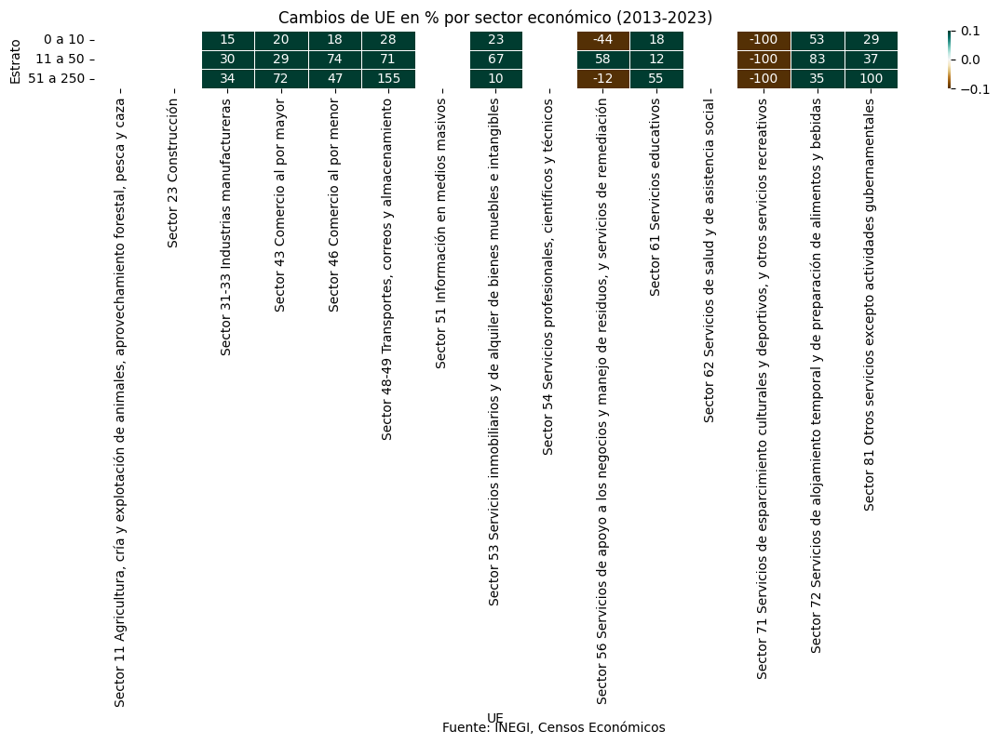

In [ ]:
# Create a heatmap
plt.figure(figsize=(12, 8))

sns.heatmap(ue_diff,
            annot=True,
            fmt=".0f",
            cmap="BrBG",
            linewidths=.5)

# Add labels and title
plt.xlabel('UE')

plt.ylabel('Estrato')
plt.yticks(rotation=0)

plt.title('Cambios de UE en % por sector económico (2013-2023)')
plt.tight_layout() # Adjust layout
plt.figtext(0.5, 0.01, "Fuente: INEGI, Censos Económicos",
            ha="center",
            fontsize=10)
plt.show()

### QN3

**De qué manera se puede comprender la estructura económica de las empresas**

Medidas calculadas de variable observada por numero de unidad económicas regsitradas por sector

In [ ]:
# Convert relevant columns to numeric, coercing errors
numeric_cols = ['A111A', 'UE', 'A131A', 'A211A', 'A511A', 'H001A', 'H001B', 'H001C', 'H001D',
                'H000A', 'H000B', 'H000C', 'H000D', 'H010A', 'H010B', 'H010C', 'H010D',
                'H203B', 'H020A', 'H020D', 'I200A', 'I200B', 'I200C', 'I200D', 'J000A',
                'J300A', 'J400A', 'J500A', 'A700A', 'A800A']

for col in numeric_cols:
    ce_bc[col] = pd.to_numeric(ce_bc[col], errors='coerce')

# Now perform the calculations
# produccion bruta total
ce_bc["prod_brut_ue"]= ce_bc['A111A']/ce_bc['UE']

# valor agregado censal bruto
ce_bc["vacb_ue"] = ce_bc['A131A']/ce_bc['UE']

# inversion
ce_bc["inv_ue"] = ce_bc["A211A"] /ce_bc['UE']

# Margen por reventa de mercancías
ce_bc["margen_ue"] = ce_bc["A511A"]/ce_bc['UE']

# Personal ocupado total
ce_bc["pers_ocup_ue"] = ce_bc["H001A"]/ce_bc['UE']

# Personal ocupado total, hombres
ce_bc["persh_ocup_ue"] = ce_bc["H001B"]/ce_bc['UE']

# Personal ocupado total, mujeres
ce_bc["persm_ocup_ue"] = ce_bc["H001C"]/ce_bc['UE']

# horas trabajas por personal ocupado
ce_bc["hrs_ocup_ue"] = ce_bc["H001D"]/ce_bc['UE']

# Personal dependiente de la razón social
ce_bc["pers_dep_ue"] = ce_bc["H000A"]/ce_bc['UE']

# Personal dependiente de la razón social, hombres
ce_bc["persh_dep_ue"] = ce_bc["H000B"]/ce_bc['UE']

# Personal dependiente de la razón social, mujeres
ce_bc["persm_dep_ue"] = ce_bc["H000C"]/ce_bc['UE']

# Horas trabajadas por personal dependiente de la razón social
ce_bc["hrs_dep_pers_ue"] = ce_bc["H000D"]/ce_bc['UE']

# personal remunerado
ce_bc["pers_rem_ue"] = ce_bc["H010A"]/ce_bc['UE']

# Personal remunerado, hombres
ce_bc["persh_rem_ue"]= ce_bc["H010B"]/ce_bc['UE']

# Personal remunerado, mujeres
ce_bc["persm_rem_ue"]= ce_bc["H010C"]/ce_bc['UE']

# Horas trabajadas por personal remunerado
ce_bc["hrs_rem_ue"]= ce_bc["H010D"]/ce_bc['UE']

# Personal administrativo, contable y de dirección, hombres
ce_bc["AdConDir_homb_ue"]= ce_bc["H203B"]/ce_bc['UE']

# Personal administrativo, contable y de dirección, mujeres
ce_bc["AdConDir_muj_ue"]= ce_bc["H203B"]/ce_bc['UE']

# Propietarios, familiares y otros trabajadores no remunerados
ce_bc["pers_no_rem_ue"]= ce_bc["H020A"]/ce_bc['UE']

# Horas trabajadas por propietarios, familiares y otros trabajadores no remunerados
ce_bc["hrs_no_rem_ue"]= ce_bc["H020D"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base
ce_bc["pers_s/sueldo_ue"]= ce_bc["I200A"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base, hombres
ce_bc["persh_s/sueldo_ue"] = ce_bc["I200B"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base, mujeres
ce_bc["persm_s/sueldo_ue"] = ce_bc["I200C"]/ce_bc['UE']

# Horas trabajadas por personal por honorarios o comisiones sin sueldo base
ce_bc["hrs_s/sueldo_ue"] = ce_bc["I200D"]/ce_bc['UE']

# Remuneraciones
ce_bc["remuneracion_ue"] = ce_bc["J000A"]/ce_bc['UE']

# Contribuciones patronales a regímenes de seguridad social
ce_bc["contribucion_ue"] = ce_bc["J300A"]/ce_bc['UE']

# otras prestaciones socials
ce_bc["otras_prest_ue"] = ce_bc["J400A"]/ce_bc['UE']

# Utilidades repartidas a los trabajadores
ce_bc["utilidad_ue"] = ce_bc["J500A"]/ce_bc['UE']

# total de gastos
ce_bc["gastos_ue"] = ce_bc["A700A"]/ce_bc['UE']

# total ingresos
ce_bc["ingresos_ue"] = ce_bc["A800A"]/ce_bc['UE']

# rentabilidad calculated
ce_bc["rentabilidad"] = (ce_bc["A800A"] - ce_bc["A700A"])/ce_bc['UE']

Tendencias en formato grafico

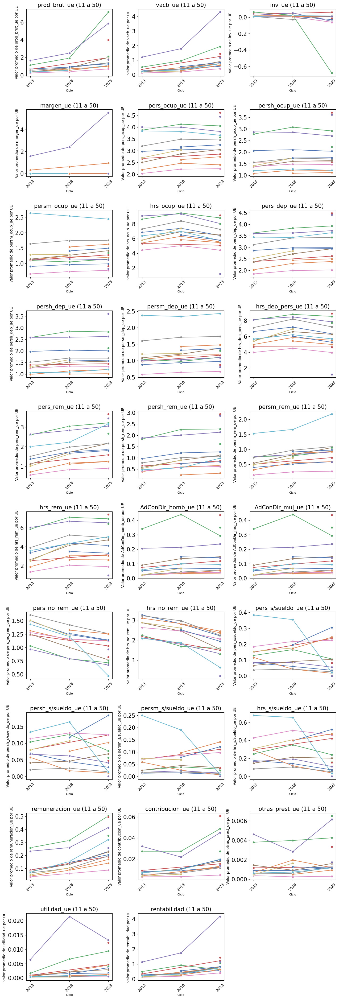

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#####  PRINTING FORMAT #######

# sort ascendig in ce_bc_micro by Año
ce_bc = ce_bc.sort_values(by='Año')

ce_bc_micro = ce_bc[(ce_bc['Estrato']== "0 a 10")].drop(columns=['Estrato']) # "0 a 10", "11 a 50", "51 a 250"

# list of variables
relevant_cols = ["prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
                    "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
                    "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
                    "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                    "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]

# mini charts in grid
n_cols = 3 # Number of columns in the grid
n_rows = (len(relevant_cols) + n_cols - 1) // n_cols # Calculate number of rows based on the number of variables and columns

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5)) # Adjust figure size

axes = axes.flatten() # Flatten the axes array for easy iteration

for i, col in enumerate(relevant_cols):
    # Plot all variables in relevant_cols, as the grid size is calculated based on the number of variables
    sns.lineplot(data=ce_bc_micro,
                 x='Año',
                 y=col,
                 hue='Actividad', # Use the new column with shorter names for hue
                 marker='o',
                 palette="deep",
                 ax=axes[i],
                 legend=False) # Remove individual subplot legends

    axes[i].set_title(f'{col} (11 a 50)', fontsize=15) # Set title for each subplot
    axes[i].set_xlabel('Ciclo', fontsize=8) # Set xlabel for each subplot
    axes[i].set_ylabel(f'Valor promedio de {col} por UE', fontsize=10) # Set ylabel for each subplot
    axes[i].tick_params(axis='x', rotation=45, labelsize=10) # Rotate x-axis labels and adjust font size
    axes[i].tick_params(axis='y', labelsize=15) # Adjust y-axis label font size


# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.subplots_adjust(hspace=0.5, wspace=0.3, bottom=0.15) # Adjust spacing to make space for the legend at the bottom
plt.show()

# legend name at the end of each line



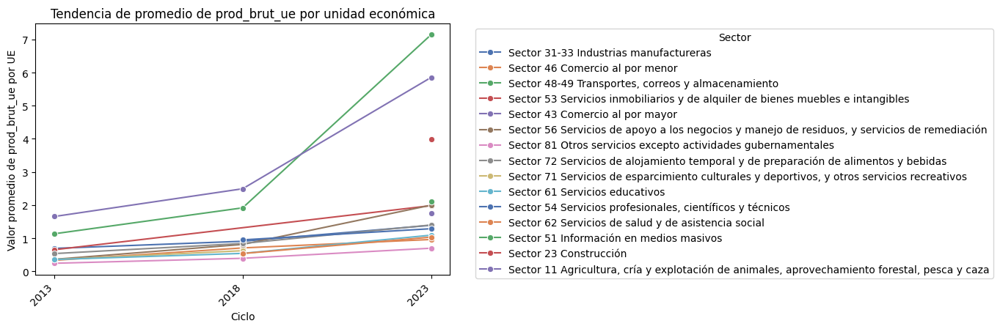

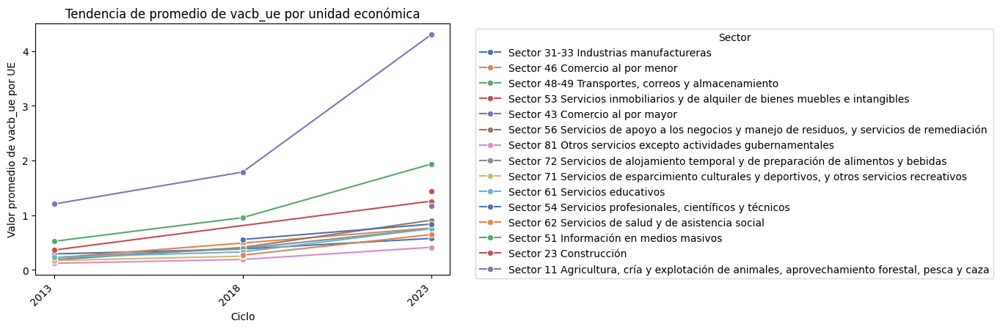

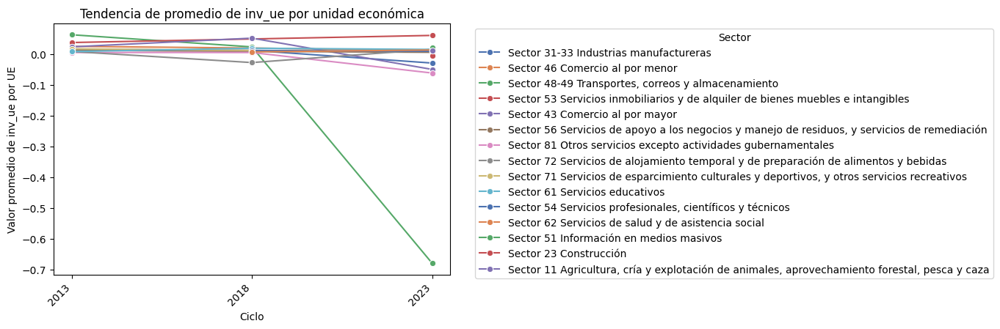

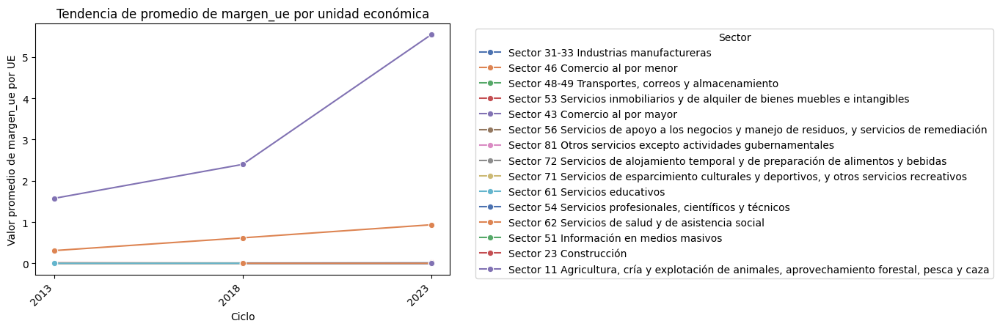

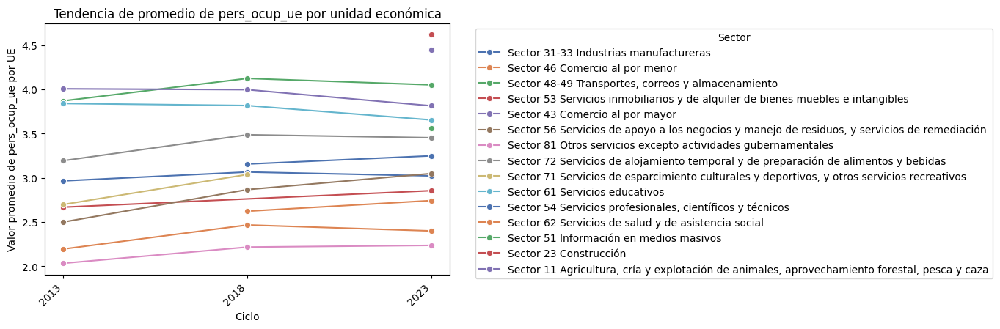

...

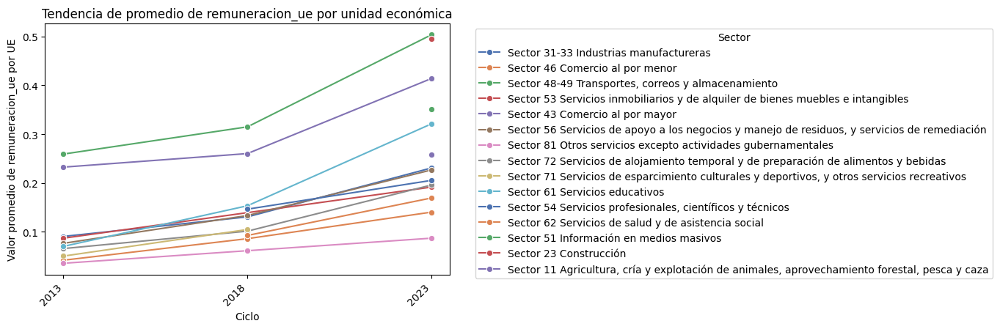

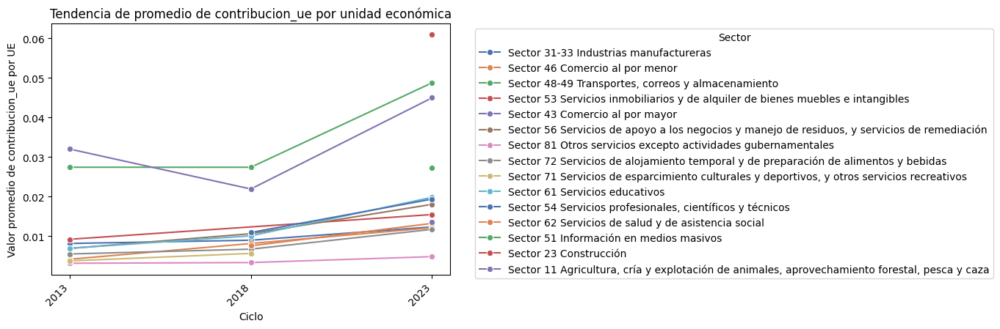

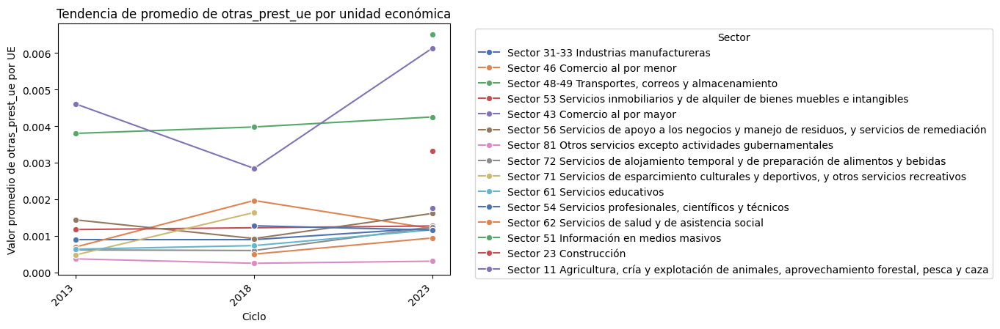

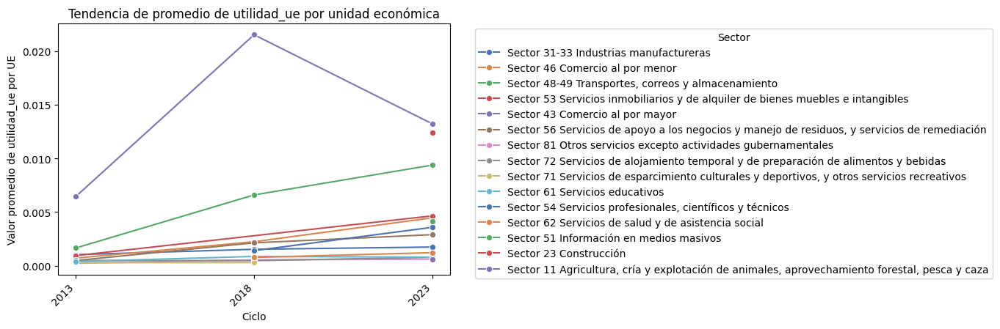

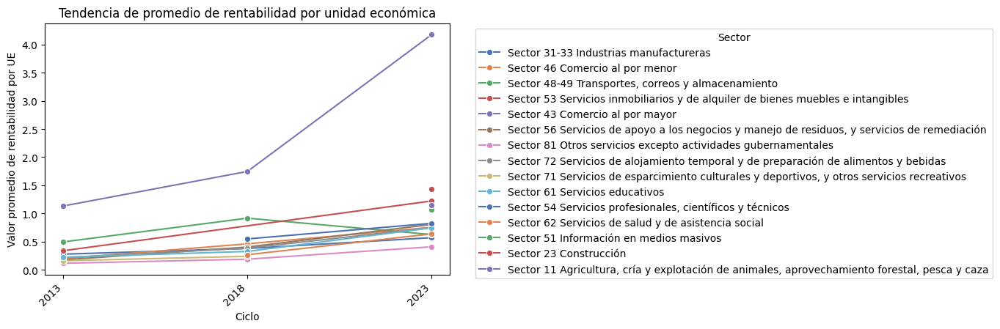

In [ ]:
#### ANALYZING IN TABULAR FORMAT ####


ce_bc_pequena= ce_bc[(ce_bc['Estrato']== "0 a 10")].drop(columns=['Estrato'])

# list of variables
relevant_cols = ["prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
                    "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
                    "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
                    "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                    "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]



# chart function
for col in relevant_cols:
    plt.figure(figsize=(14, 4.6))
    sns.lineplot(data=ce_bc_pequena,
                 x='Año',
                 y=col,
                 hue='Actividad',
                 marker='o',
                 palette="deep")

    plt.title(f'Tendencia de promedio de {col} por unidad económica')
    plt.xlabel('Ciclo')
    plt.ylabel(f'Valor promedio de {col} por UE')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Sector', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# just one box of legend


Tendencias en formato tabular

In [ ]:
# transpose matrix
import numpy as np


# Melt the DataFrame to transform columns into rows
ce_bc_melted = ce_bc.melt(
    id_vars=['Año', 'Entidad', 'Estrato', 'Actividad'],
    var_name='Variable',
    value_name='Value'
)

# Pivot the melted DataFrame to transpose it
ce_bc_transposed = ce_bc_melted.pivot_table(index=["Variable",'Actividad', 'Estrato'],
                                            columns='Año',
                                            values='Value',
                                            aggfunc='sum',
                                            fill_value=0)


# filter index
ce_bc_transposed = ce_bc_transposed.reset_index()

# filter columns with ISIN
ce_bc_transposed = ce_bc_transposed[ce_bc_transposed["Variable"].isin([
                                    "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
                                   "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
                                   "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
                                   "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                   "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"])]

# index variable
ce_bc_transposed = ce_bc_transposed.set_index('Variable')

# fill NAN with Zeros and Drop it
ce_bc_transposed = ce_bc_transposed.fillna(0)

# numeric 2013, 2018 and 2023
ce_bc_transposed['2013'] = ce_bc_transposed['2013'].astype(int)
ce_bc_transposed['2018'] = ce_bc_transposed['2018'].astype(int)
ce_bc_transposed['2023'] = ce_bc_transposed['2023'].astype(int)

# delta 2018 to  2023
ce_bc_transposed["18 vs 13 (%)"]= round(((ce_bc_transposed['2018'] / ce_bc_transposed['2013']) - 1) *100,2)
ce_bc_transposed["23 vs 18 (%)"]= round(((ce_bc_transposed['2023'] / ce_bc_transposed['2018']) - 1) *100,2)

# Infinite to NaN and NaN to Zeros
ce_bc_transposed.replace([np.inf, -np.inf], np.nan, inplace=True)
ce_bc_transposed = ce_bc_transposed.fillna(0)

# drop rows with zeros in columsn 2013, 2018, 2023
ce_bc_transposed = ce_bc_transposed[(ce_bc_transposed['2013'] != 0) &
                                      (ce_bc_transposed['2018'] != 0) &
                                      (ce_bc_transposed['2023'] != 0)]

ce_bc_transposed.round(2)

ce_bc_transposed.to_excel('tendencias.xlsx')


/tmp/ipython-input-3426399750.py:35: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ce_bc_transposed = ce_bc_transposed.fillna(0)


Medidas de tendencia central

In [ ]:
# Select the relevant columns using a list of column names, including 'Actividad'
#listado_ce_bc = ce_bc[["Año", "Estrato","Actividad", "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
#                    "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
#                    "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
#                    "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
#                    "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "gastos_ue", "ingresos_ue", "rentabilidad"]]

# filter by size, wrapping each condition in parentheses
#listado_ce_bc = ce_bc_micro[(ce_bc_micro['Estrato']== "0 a 10")].drop(columns=['Estrato'])

In [ ]:
# descriptive by each list in ce_bc_micro

# Unidades
ce_bc_unidad= ce_bc[(ce_bc['Estrato']== "11 a 50")].drop(columns=['Estrato']) # "0 a 10", "11 a 50", "51 a 250",


#####

ocupacion = ["pers_ocup_ue", "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
            "pers_dep_ue", "persh_dep_ue", "persm_dep_ue", "hrs_dep_pers_ue",
            "hrs_rem_ue", "AdConDir_homb_ue", "AdConDir_muj_ue",
            "hrs_no_rem_ue", "hrs_s/sueldo_ue"]

remuneracion = ["pers_rem_ue", "persh_rem_ue","persm_rem_ue", "pers_s/sueldo_ue",
                "persh_s/sueldo_ue", "persm_s/sueldo_ue", "pers_no_rem_ue"]



empresa = ["prod_brut_ue","vacb_ue","inv_ue","margen_ue",
          "remuneracion_ue", "contribucion_ue", "otras_prest_ue", "utilidad_ue", "rentabilidad"]

# Group descriptive statistics by 'Actividad' for 'ocupacion' variables without NaN
descriptive_ocupacion = ce_bc_unidad.groupby('Actividad')[ocupacion].agg(['median', "std","max", "min"]).round(3).fillna(0)

# Group descriptive statistics by 'Actividad' for 'remuneracion' variables
descriptive_remuneracion = ce_bc_unidad.groupby('Actividad')[remuneracion].agg(['median', "std", "max", "min"]).round(3).fillna(0)

# Group descriptive statistics by 'Actividad' for 'empresa' variables, fill NAN with zeros
descriptive_empresa = ce_bc_unidad.groupby('Actividad')[empresa].agg(['median', "std","max", "min"]).round(3).fillna(0)

# export tables to excel

descriptive_ocupacion.to_excel('ocupacio.xlsx')
descriptive_remuneracion.to_excel('remuneracion.xlsx')
descriptive_empresa.to_excel('empresa.xlsx')

### QN4

**De qué manera los sectores tienen similitudes entre ellos para el último ciclo censado**

#### PCA-Micro

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_micro= ce_bc.loc[:, ["Año","Estrato", "Actividad",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_micro = cluster_23_micro[(cluster_23_micro['Año']== "2023")].drop(columns=['Año'])

cluster_23_micro = cluster_23_micro[(cluster_23_micro['Estrato']== "0 a 10")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_micro = cluster_23_micro.set_index('Actividad')

PCA para reducir dimensionalidad

https://cienciadedatos.net/documentos/py19-pca-python#Ejemplo_PCA

In [ ]:
# # Tratamiento de dato
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Gráficos
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import style

# Preprocesado y modelado
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale


In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_micro)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_micro.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,0.294512,0.269451,-0.145482,0.185668,0.247941,-0.086724,0.205894,0.248613,-0.069528,0.213333,...,0.261025,-0.212067,-0.124776,-0.107819,-0.169676,-0.136467,0.299385,0.277725,0.288719,0.224983
PC2,-0.043365,-0.024532,0.042431,-0.003697,-0.217310,0.459992,0.164293,-0.205555,0.472992,0.179425,...,0.206082,-0.237882,-0.063987,-0.147162,-0.134730,-0.157340,0.005390,0.032769,-0.066732,-0.021814
PC3,0.135346,0.073628,-0.141927,0.060912,-0.183464,0.026523,0.313798,-0.206321,-0.010143,0.278246,...,0.172213,0.095207,0.349351,0.391735,0.349970,0.392263,0.127297,0.065948,0.191709,0.024558
PC4,-0.053071,0.367384,0.336440,0.529418,-0.147141,0.044716,-0.189699,-0.148617,0.033110,-0.194846,...,-0.170734,-0.026314,-0.092022,0.044907,0.096128,0.048186,-0.121880,0.080638,0.069961,0.501284
PC5,-0.103173,-0.021195,0.134896,0.176099,-0.139681,-0.135694,0.202795,-0.115136,-0.096741,0.234379,...,0.083480,0.305062,0.481725,-0.370056,-0.323774,-0.343595,-0.116969,-0.006221,0.019384,0.041589
PC6,-0.339261,-0.178949,0.746088,-0.183611,0.187460,0.024467,0.166076,0.172329,0.003690,0.149902,...,0.170535,0.095971,-0.048476,0.092411,0.157167,0.062945,0.174125,0.066350,0.091540,0.078724
PC7,-0.156157,-0.109272,0.074126,-0.072229,-0.207404,-0.280691,0.065049,-0.217693,-0.269058,0.049782,...,0.112024,-0.469330,-0.184697,0.103196,-0.151064,0.036185,-0.199172,0.535632,-0.149746,-0.105171
PC8,0.038368,0.105490,-0.110691,-0.037915,0.161903,0.177551,0.012015,0.157277,0.157794,0.002743,...,-0.005131,0.486141,0.024229,0.021819,0.077762,0.048541,-0.232753,0.636866,-0.388516,0.035824
PC9,-0.022789,0.078321,-0.003665,0.142653,0.153292,-0.078348,0.162455,0.127223,-0.028787,0.174378,...,0.196938,-0.002666,-0.052000,0.531410,-0.372831,0.005499,-0.341040,-0.374500,-0.344920,0.135654
PC10,-0.264094,-0.139058,-0.084401,0.137153,0.044998,0.075426,-0.166392,0.015770,0.116454,-0.151028,...,-0.213737,0.097735,0.176443,0.484403,-0.395527,-0.167814,0.186427,0.251970,0.407956,-0.176371


------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.41417576 0.5964669  0.75058708 0.84424451 0.91989572 0.9574596
 0.9775534  0.99059457 0.99525485 0.99770787 0.99966232 0.99990052
 1.         1.        ]


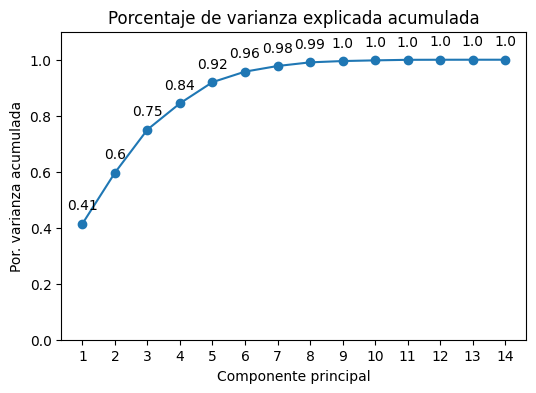

In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.plot(
    np.arange(len(prop_varianza_acum)) + 1, # Changed x-axis to match length of explained variance
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(len(prop_varianza_acum)) + 1, prop_varianza_acum): # Changed x-axis in zip as well
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');

De acuerdo a las estimaciones de PCA, solo utilizaremos el PCA-5 ya que explica el 90% de las observaciones. Esto con la finalidad de contemplar la mayor cantidad de variables para un análisis descriptivo (al menos el 80%) o para otro tipos de análisis (90%)

https://support.minitab.com/en-us/minitab/help-and-how-to/statistical-modeling/multivariate/how-to/principal-components/interpret-the-results/all-statistics-and-graphs/

The relevance of loadings in the corresponding PCA

http://stratigrafia.org/8370/lecturenotes/principalComponents.html

https://statisticsbyjim.com/basics/principal-component-analysis/

In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[4]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_micro.columns)

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
hrs_no_rem_ue,0.481725
pers_no_rem_ue,0.305062
hrs_dep_pers_ue,0.234379
hrs_ocup_ue,0.202795
margen_ue,0.176099
inv_ue,0.134896
hrs_rem_ue,0.083480
rentabilidad,0.041589
utilidad_ue,0.019384
otras_prest_ue,-0.006221


In [ ]:
# new cluster_23_micro

cluster_23_micro = cluster_23_micro[["hrs_no_rem_ue","pers_no_rem_ue","hrs_dep_pers_ue","hrs_ocup_ue","margen_ue","inv_ue"]]

#### Hierarchical analysis-Micro

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

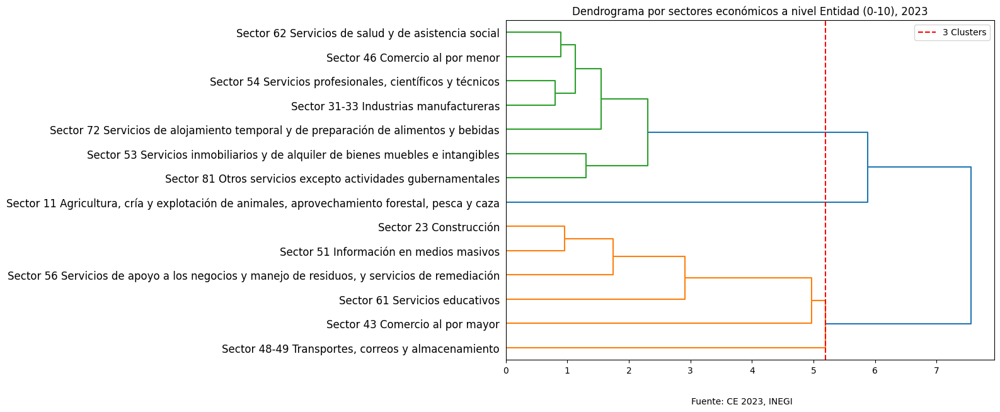

,hrs_no_rem_ue,pers_no_rem_ue,hrs_dep_pers_ue,hrs_ocup_ue,margen_ue,inv_ue,Hierarchical_Cluster
Actividad,,,,,,,
Sector 51 Información en medios masivos,1.305301,0.756098,7.720081,8.014715,0.000000,0.020350,1
"Sector 48-49 Transportes, correos y almacenamiento",1.588480,0.715556,8.538293,8.817138,0.000000,-0.680439,1
Sector 23 Construcción,1.498861,0.823729,8.900461,9.174956,0.014980,-0.006180,1
Sector 43 Comercio al por mayor,1.320021,0.673301,7.844177,8.047054,5.542586,-0.049963,1
Sector 61 Servicios educativos,0.632628,0.468807,5.696327,5.730719,0.000406,0.015106,1
"Sector 56 Servicios de apoyo a los negocios y manejo de residuos, y servicios de remediación",1.542777,0.768610,6.265591,6.488836,0.000000,0.005678,1
Sector 31-33 Industrias manufactureras,2.212019,1.129755,6.340693,6.416368,0.009128,-0.029304,2
Sector 46 Comercio al por menor,2.450063,1.132553,5.516556,5.554649,0.933758,0.011306,2
Sector 72 Servicios de alojamiento temporal y de preparación de alimentos y bebidas,2.246888,1.261424,7.211137,7.261885,0.000000,0.015526,2



Descripción estadistica por cada cluster:


,hrs_no_rem_ue,pers_no_rem_ue,hrs_dep_pers_ue,hrs_ocup_ue,margen_ue,inv_ue
Hierarchical_Cluster,,,,,,
1,1.315,0.701,7.494,7.712,0.926,-0.116
2,2.110,1.153,5.420,5.712,0.135,0.003
3,0.214,0.966,1.193,1.193,0.000,0.012


In [ ]:
# Automatic clusterization

from scipy.cluster.hierarchy import *
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import numpy as np


# escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_23_micro)

linked_data = linkage(X_scaled, method='ward', metric='euclidean')


plt.figure(figsize=(10, 7))
plt.title("Dendrograma por sectores económicos a nivel Entidad (0-10), 2023")
dendrogram(linked_data,
           labels=cluster_23_micro.index,
           leaf_rotation=0,
           orientation="right")
plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_micro['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_micro = cluster_23_micro.sort_values(by='Hierarchical_Cluster')
display(cluster_23_micro)
# order hierarchil cluster


# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_micro.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

Metricas de evaluación

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_micro)
Z = linkage(cluster_23_micro, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_micro, cluster_23_micro['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_micro, cluster_23_micro['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.70
Davies-Bouldin Score: 0.83
Calinski-Harabasz Score: 8.84


#### PCA-Pequeno

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_pequeno= ce_bc.loc[:, ["Año","Estrato", "Actividad",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_pequeno = cluster_23_pequeno[(cluster_23_pequeno['Año']== "2023")].drop(columns=['Año'])

cluster_23_pequeno = cluster_23_pequeno[(cluster_23_pequeno['Estrato']== "11 a 50")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_pequeno = cluster_23_pequeno.set_index('Actividad')

PCA para reducir dimensionalidad

In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_pequeno)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_pequeno.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,0.269218,0.250265,0.093642,0.154737,0.289478,-0.233555,-0.011241,0.290865,-0.227635,-0.005121,...,0.009739,-0.115131,-0.194969,-0.203947,-0.266661,-0.249630,0.201548,0.204902,0.222558,0.247330
PC2,0.157956,0.182327,0.090009,0.174013,-0.171048,0.212548,0.341199,-0.178362,0.209880,0.339993,...,0.343827,-0.246644,0.057621,0.110273,0.049387,0.074991,0.268705,0.287979,0.239910,0.179245
PC3,0.148277,0.197431,0.443092,0.104119,0.001098,-0.195392,-0.042362,-0.020337,-0.218166,-0.069243,...,-0.090050,0.220515,0.248832,0.395137,0.321476,0.359771,-0.101302,-0.048265,0.155790,0.203463
PC4,0.018472,-0.234284,-0.082007,-0.350715,0.193563,-0.187032,0.353447,0.176302,-0.191164,0.346053,...,0.328432,0.073008,0.338686,0.103156,-0.027700,0.065594,0.195544,-0.090741,-0.114823,-0.245736
PC5,0.298105,0.142633,-0.153668,-0.323932,0.211587,0.282413,-0.123097,0.194441,0.273744,-0.145339,...,-0.155169,0.371796,0.081948,0.187377,0.058385,0.077500,0.281480,0.218869,-0.172039,0.139314
PC6,-0.257583,0.094701,-0.262899,0.434598,-0.041414,-0.017676,0.027941,-0.013823,-0.000104,0.052684,...,0.015784,0.526270,0.496772,-0.154980,-0.252277,-0.104655,-0.033892,0.136121,0.070213,0.101530
PC7,0.044220,0.140133,0.613908,-0.004994,0.037030,0.142402,0.106483,0.043122,0.155952,0.119436,...,0.115093,0.117056,0.094268,-0.226424,-0.211715,-0.193912,-0.122385,-0.352485,-0.414963,0.147646
PC8,0.108921,0.154764,-0.379030,0.493991,0.127115,0.007075,0.073110,0.117261,-0.001851,0.057786,...,0.066083,-0.155915,-0.089684,-0.021892,0.279574,0.273463,0.085264,-0.354229,-0.425416,0.111660
PC9,0.665963,0.040458,-0.241526,-0.143521,-0.088090,-0.009101,0.102722,-0.103749,-0.011847,0.076358,...,0.075848,0.142989,0.030781,-0.319458,0.021011,0.059673,-0.526355,-0.050042,0.126602,-0.014517
PC10,0.211962,0.158301,-0.117509,-0.167245,-0.276792,-0.182581,-0.114063,-0.289592,-0.191645,-0.113327,...,-0.138870,-0.190226,0.296513,-0.032721,0.017258,-0.310170,0.364703,-0.014324,-0.352227,0.135311


------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.37219092 0.6382983  0.77650411 0.8813731  0.92764007 0.96362074
 0.98231191 0.9907097  0.99479885 0.99750717 0.99874156 0.99978148
 1.         1.        ]


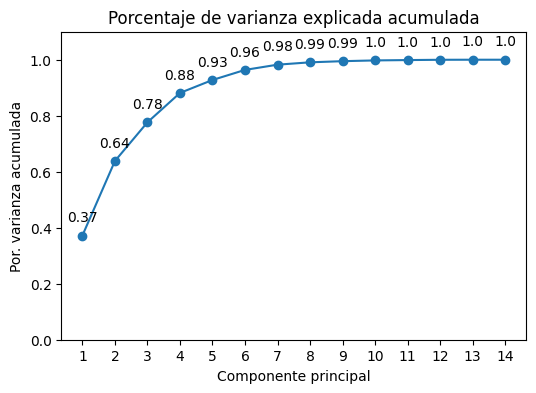

In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.plot(
    np.arange(len(prop_varianza_acum)) + 1, # Changed x-axis to match length of explained variance
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(len(prop_varianza_acum)) + 1, prop_varianza_acum): # Changed x-axis in zip as well
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');

In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[4]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_pequeno.columns)

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
pers_no_rem_ue,0.371796
prod_brut_ue,0.298105
persm_ocup_ue,0.282413
contribucion_ue,0.281480
persm_dep_ue,0.273744
persm_rem_ue,0.265106
otras_prest_ue,0.218869
persh_ocup_ue,0.211587
persh_dep_ue,0.194441
persh_s/sueldo_ue,0.187377


In [ ]:
# new cluster_23_mediano

cluster_23_pequeno = cluster_23_pequeno[["pers_no_rem_ue","prod_brut_ue", "persm_ocup_ue", "contribucion_ue","persm_dep_ue",
                                         "persm_rem_ue", "otras_prest_ue","persh_ocup_ue", "persh_dep_ue", "persh_s/sueldo_ue",
                                         "persh_rem_ue", "vacb_ue","rentabilidad"]]

#### Hierarchical analysis-Pequeno

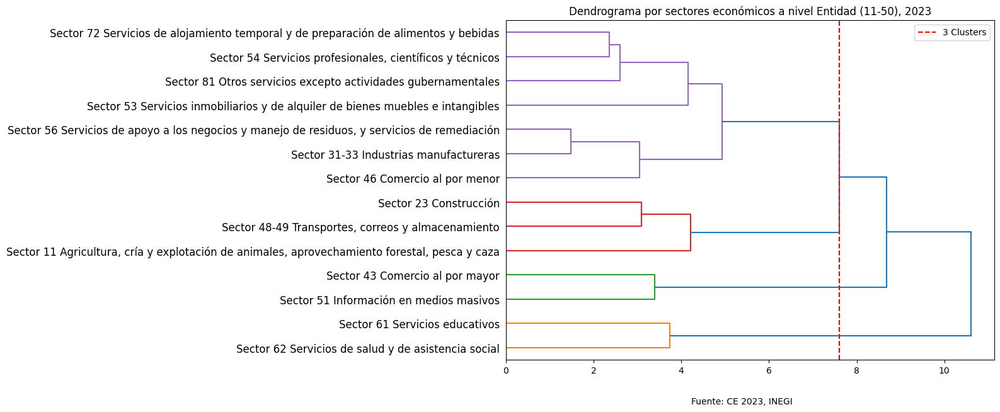

,pers_no_rem_ue,prod_brut_ue,persm_ocup_ue,contribucion_ue,persm_dep_ue,persm_rem_ue,otras_prest_ue,persh_ocup_ue,persh_dep_ue,persh_s/sueldo_ue,persh_rem_ue,vacb_ue,rentabilidad,Hierarchical_Cluster
Actividad,,,,,,,,,,,,,,
Sector 61 Servicios educativos,0.441109,8.174187,15.993072,0.291122,15.766744,15.517321,0.032998,6.491917,6.314088,0.177829,6.122402,6.092769,6.065208,1
Sector 62 Servicios de salud y de asistencia social,1.353234,8.818689,13.641791,0.225239,13.074627,12.475124,0.022478,6.350746,5.699005,0.644279,4.945274,5.326465,5.209624,1
Sector 51 Información en medios masivos,0.229508,35.810459,10.721311,0.597590,10.409836,10.327869,0.111279,16.147541,15.590164,0.229508,15.442623,16.738836,15.901443,2
Sector 43 Comercio al por mayor,0.329723,31.281060,6.931408,0.455647,6.759326,6.661853,0.091196,14.219013,13.965102,0.150421,13.732852,25.128292,24.169515,2
Sector 31-33 Industrias manufactureras,0.501706,18.723455,7.721274,0.460927,7.575654,7.399317,0.059299,15.328783,14.904437,0.218430,14.579067,8.368033,8.201201,3
Sector 23 Construcción,0.376344,31.739513,3.720430,0.424803,3.566308,3.483871,0.041326,20.279570,19.401434,0.168459,19.107527,10.877871,10.134018,3
Sector 46 Comercio al por menor,0.256769,15.608097,8.833624,0.352892,8.783406,8.703930,0.081949,11.226638,11.079039,0.139738,10.901747,12.083846,11.965820,3
"Sector 48-49 Transportes, correos y almacenamiento",1.375350,20.257171,5.313725,0.446364,5.145658,4.910364,0.054647,17.896359,17.344538,0.291317,16.204482,11.641134,11.370669,3
"Sector 54 Servicios profesionales, científicos y técnicos",0.908012,8.090217,9.026706,0.266947,8.691395,8.424332,0.036454,10.531157,10.103858,0.427300,9.462908,5.745021,5.686926,3



Descripción estadistica por cada cluster:


,pers_no_rem_ue,prod_brut_ue,persm_ocup_ue,contribucion_ue,persm_dep_ue,persm_rem_ue,otras_prest_ue,persh_ocup_ue,persh_dep_ue,persh_s/sueldo_ue,persh_rem_ue,vacb_ue,rentabilidad
Hierarchical_Cluster,,,,,,,,,,,,,
1,0.897,8.496,14.817,0.258,14.421,13.996,0.028,6.421,6.007,0.411,5.534,5.710,5.637
2,0.280,33.546,8.826,0.527,8.585,8.495,0.101,15.183,14.778,0.190,14.588,20.934,20.035
3,0.716,16.143,6.890,0.319,6.702,6.497,0.039,14.715,14.333,0.228,13.821,8.886,8.682


In [ ]:
# Automatic clusterization

# Automatic clusterization

from scipy.cluster.hierarchy import *
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import numpy as np


# escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_23_pequeno)

linked_data = linkage(X_scaled, method='ward', metric='euclidean')


plt.figure(figsize=(10, 7))
plt.title("Dendrograma por sectores económicos a nivel Entidad (11-50), 2023")
dendrogram(linked_data,
           labels=cluster_23_pequeno.index,
           leaf_rotation=0,
           orientation="right")
plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_pequeno['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_pequeno = cluster_23_pequeno.sort_values(by='Hierarchical_Cluster')
display(cluster_23_pequeno)
# order hierarchil cluster


# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_pequeno.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_pequeno)
Z = linkage(cluster_23_pequeno, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_pequeno, cluster_23_pequeno['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_pequeno, cluster_23_pequeno['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.62
Davies-Bouldin Score: 0.68
Calinski-Harabasz Score: 7.86


#### PCA-Mediano

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_mediano= ce_bc.loc[:, ["Año","Estrato", "Actividad",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_mediano = cluster_23_mediano[(cluster_23_mediano['Año']== "2023")].drop(columns=['Año'])

cluster_23_mediano = cluster_23_mediano[(cluster_23_mediano['Estrato']== "51 a 250")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_mediano = cluster_23_mediano.set_index('Actividad')

PCA para reducir dimensionalidad

In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_mediano)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_mediano.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,0.281619,0.289527,0.085179,0.112392,0.288917,-0.218627,0.107500,0.278248,-0.199577,0.115490,...,0.118824,-0.152529,-0.151371,-0.218826,-0.279326,-0.282157,0.165629,0.118154,0.197910,0.284772
PC2,-0.001896,0.116128,0.190374,0.153739,-0.065296,0.300057,0.358337,-0.044853,0.315109,0.356835,...,0.355102,0.055720,0.127684,0.112869,0.085483,0.072228,0.288403,0.277272,0.177965,0.096607
PC3,0.109128,-0.036124,-0.196955,-0.371077,0.207117,-0.078603,0.181711,0.205453,-0.076997,0.187394,...,0.177956,0.470636,0.488890,0.092436,0.027466,0.030966,0.046817,-0.264956,-0.152368,-0.033613
PC4,0.128604,0.196472,-0.026260,0.343583,-0.192137,-0.028960,-0.140162,-0.223707,-0.036479,-0.173086,...,-0.181346,0.426299,0.388274,-0.075615,-0.154386,-0.091229,-0.022596,-0.084357,0.430691,0.184963
PC5,-0.122458,-0.161972,0.672018,-0.038678,-0.015889,-0.041552,-0.054462,0.015510,-0.003018,-0.016936,...,-0.020618,0.245306,0.180145,-0.259227,-0.240294,-0.235759,-0.105715,0.290013,-0.294205,-0.210980
PC6,0.314403,0.065701,0.079185,-0.449091,0.031889,0.047231,-0.233681,-0.033735,0.013514,-0.275721,...,-0.276638,0.053556,0.012953,0.229636,0.091437,0.064633,0.496940,0.390846,0.006579,0.088411
PC7,-0.139459,-0.055897,-0.022976,0.466290,0.271838,0.046556,-0.265013,0.395726,0.078596,-0.134424,...,-0.135824,0.202449,0.053452,0.017099,0.301989,0.253918,0.018556,0.198028,0.058357,-0.116001
PC8,-0.100193,0.022642,0.440200,0.207717,0.066447,-0.191363,0.083828,-0.048572,-0.238654,0.018451,...,0.019509,-0.011596,-0.050196,0.712149,0.097234,-0.005923,0.098457,-0.234125,0.015673,-0.003975
PC9,0.134641,-0.110448,0.115855,0.075520,-0.070653,-0.213212,0.198389,-0.139423,-0.310540,0.059762,...,0.055951,-0.180058,0.195549,-0.395689,0.331158,0.479604,0.172221,0.104152,0.051711,-0.130875
PC10,-0.489914,0.386710,0.223044,-0.308919,0.110514,0.018726,0.008698,0.024790,-0.001260,-0.082752,...,-0.085641,-0.078362,0.133190,-0.105272,0.166491,0.219810,-0.242148,-0.008903,0.049074,0.514932


------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.43389205 0.68066316 0.75770854 0.82596506 0.88034305 0.91724615
 0.94455268 0.96823125 0.98328655 0.99015975 0.99625461 0.9998451
 1.         1.        ]


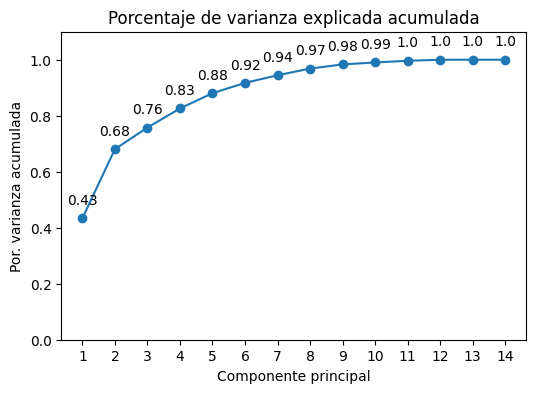

In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.plot(
    np.arange(len(prop_varianza_acum)) + 1, # Changed x-axis to match length of explained variance
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(len(prop_varianza_acum)) + 1, prop_varianza_acum): # Changed x-axis in zip as well
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');

In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[5]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_mediano.columns)

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
contribucion_ue,0.496940
otras_prest_ue,0.390846
prod_brut_ue,0.314403
persh_s/sueldo_ue,0.229636
persm_s/sueldo_ue,0.091437
rentabilidad,0.088411
inv_ue,0.079185
vacb_ue,0.065701
hrs_s/sueldo_ue,0.064633
pers_no_rem_ue,0.053556


In [ ]:
# new cluster_23_mediano

cluster_23_mediano = cluster_23_mediano[["contribucion_ue", "otras_prest_ue","prod_brut_ue","persh_s/sueldo_ue"]]

#### Hierarchical analysis-Mediano

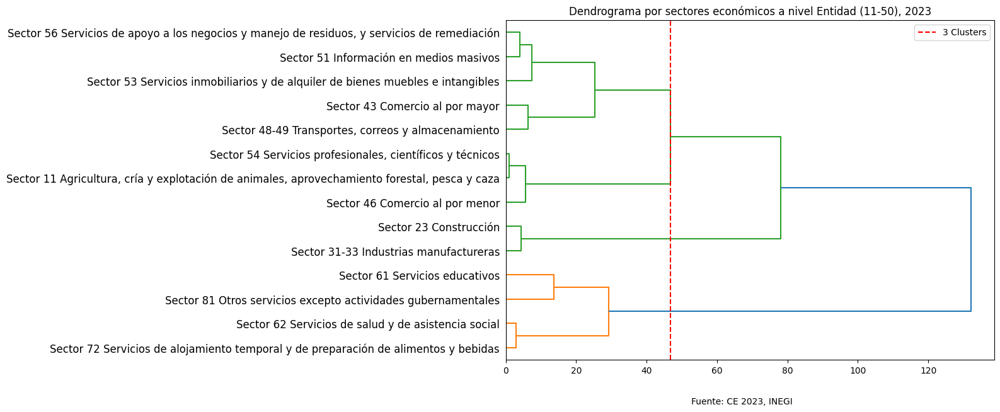

,contribucion_ue,otras_prest_ue,prod_brut_ue,persh_s/sueldo_ue,Hierarchical_Cluster
Actividad,,,,,
Sector 81 Otros servicios excepto actividades gubernamentales,1.449375,0.272875,42.488125,0.437500,1
Sector 61 Servicios educativos,1.589975,0.344975,29.447759,4.544304,1
Sector 62 Servicios de salud y de asistencia social,1.771392,0.176510,57.125471,2.686275,1
Sector 72 Servicios de alojamiento temporal y de preparación de alimentos y bebidas,0.907208,0.136900,56.160517,0.133333,1
Sector 23 Construcción,1.717975,0.109949,134.551873,0.531646,2
Sector 31-33 Industrias manufactureras,3.381626,1.009196,138.413360,0.071057,2
Sector 43 Comercio al por mayor,2.436676,0.392848,114.725840,0.248000,3
"Sector 48-49 Transportes, correos y almacenamiento",2.519743,0.606600,108.474107,0.121429,3
Sector 51 Información en medios masivos,2.102706,0.310647,95.214529,1.058824,3



Descripción estadistica por cada cluster:


,contribucion_ue,otras_prest_ue,prod_brut_ue,persh_s/sueldo_ue
Hierarchical_Cluster,,,,
1,1.429,0.233,46.305,1.950
2,2.550,0.560,136.483,0.301
3,1.971,0.403,92.819,0.631


In [ ]:
# Automatic clusterization

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt
import numpy as np

linked_data = linkage(cluster_23_mediano, method='ward', metric='euclidean')

plt.figure(figsize=(10, 7))

plt.title("Dendrograma por sectores económicos a nivel Entidad (11-50), 2023")
dendrogram(linked_data,
           labels=cluster_23_mediano.index,
           leaf_rotation=0,
           orientation="right")
plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_mediano['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_mediano = cluster_23_mediano.sort_values(by='Hierarchical_Cluster')
display(cluster_23_mediano)

# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_mediano.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_mediano)
Z = linkage(cluster_23_mediano, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_mediano, cluster_23_mediano['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_mediano, cluster_23_mediano['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.71
Davies-Bouldin Score: 0.43
Calinski-Harabasz Score: 32.17


### QN5

**Qué tipo de atributos muestran un impacto positivo en la VACB**

Se considera variable Target el VACB y las variables features toda las demas. Se consideran los sectores omo observaciones independientes en el tiempo, segmentado por los niveles de estratos correspondientes

#### Micro

In [ ]:
ce_bc_rfr_micro=ce_bc[["Estrato","Actividad",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A", "H000A", "H000D", "H020A", "H020D"]]

ce_bc_rfr_micro = ce_bc_rfr_micro[(ce_bc_rfr_micro['Estrato']== '0 a 10')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_micro = ce_bc_rfr_micro.set_index('Actividad')

Factor Analysis

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!pip install factor_analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor_analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=416b9b865ecb8936a8e35b3f22ca18ddca1d8c76b951bfeaf35b9f572d966bc7
  Stored in directory: /root/.cache/pip/wheels/a2/af/06/f4d4ed4d9d714fda437fb1583629417319603c2266e7b233cc
Successfully built factor_analyzer


In [ ]:
import pandas as pd
from factor_analyzer import FactorAnalyzer
import matplotlib.pyplot as plt
import numpy as np # Import numpy

# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=5, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_micro.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_micro.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
               0         1         2         3         4
O020A  0.159192  0.532950  0.165783 -0.054292  0.038678
H001D  0.798876  0.496251  0.307242  0.025606  0.024160
H101A  0.908804  0.319846  0.183484  0.035924  0.062531
H101D  0.894233  0.318420  0.239896  0.023237  0.059547
H203A  0.776860  0.399342  0.083549  0.373570  0.009439
H203D  0.798085  0.403976  0.164349  0.325593  0.010860
I000A  0.206109  0.893476  0.381096  0.074491 -0.075128
I000D  0.219885  0.851401  0.466140  0.069388 -0.064652
I100A  0.257898  0.313587  0.895479  0.088189 -0.012260
I100D  0.260347  0.317938  0.894304  0.086437 -0.013907
I200A  0.107012  0.972255 -0.076815  0.040619 -0.090880
J010A  0.966035  0.202168 -0.005115  0.107442  0.071199
I200D  0.122690  0.972568  0.001644  0.034283 -0.081501
J203A  0.765148  0.176553 -0.140686  0.520378  0.072667
J300A  0.947994  0.135635  0.134505  0.234387 -0.010712
J400A  0.766280  0.173802  0.555928  0.235215 -0.012426
J500A  0.879680 -0.061438  0.1

In [ ]:
# select the 4th column in loading
loadings.iloc[:,3].abs().sort_values(ascending=False)

,3
Q030A,0.893947
J600A,0.852386
K096A,0.822629
K311A,0.770518
J203A,0.520378
K060A,0.504756
K050A,0.449454
K820A,0.420868
K010A,0.413554
H203A,0.373570


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_micro = ce_bc_rfr_micro[["A131A",
                                   "Q030A", "J600A","K096A", "K311A", "J203A", "K060A", "K050A", "K820A", "K010A", "H203A",
                                   "H203D","J500A", "K950A","J400A","J300A","K090A", "K810A","Q010A","Q400A", "K020A","Q020A"]]

https://towardsdatascience.com/understanding-random-forest-using-python-scikit-learn/

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import tree

In [ ]:
# Define features and target

X = ce_bc_rfr_micro.drop(columns="A131A")
y = ce_bc_rfr_micro["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.467


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': np.int64(13), 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 460}
Best R^2 score from Randomized Search: 0.674


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 80]


,feature,importance,cumulative_percentage
6,K050A,0.038334,13.300682
13,J400A,0.032786,24.676369
10,H203D,0.032581,35.980984
14,J300A,0.032444,47.237852
15,K090A,0.031405,58.134453
16,K810A,0.020728,65.326487
9,H203A,0.018940,71.897913
12,K950A,0.015178,77.164133


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las micro empresas, son:
* Renta y alquiler de bienes muebles e inmuebles
* Otras prestaciones sociales
* Horas trabajadas por personal administrativo, contable y de dirección
* Contribuciones patronales a regímenes de seguridad social
* Consumo de otros bienes y servicios
* Gastos por publicidad
* Personal administrativo, contable y de dirección
* Reparaciones y refacciones para mantenimiento corriente




#### Pequeno

In [ ]:
ce_bc_rfr_pequeno=ce_bc[["Estrato","Actividad",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A", "H000A", "H000D", "H020A", "H020D"]]

ce_bc_rfr_pequeno = ce_bc_rfr_pequeno[(ce_bc_rfr_pequeno['Estrato']== '11 a 50')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_pequeno = ce_bc_rfr_pequeno.set_index('Actividad')

Factor Analysis

In [ ]:
# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=8, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_pequeno.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_pequeno.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
               0         1         2         3         4         5         6  \
O020A  0.177293  0.169388  0.228291  0.093290 -0.057043  0.152127 -0.016595   
H001D  0.775992  0.431801  0.027829  0.145902  0.378742  0.068994  0.161584   
H101A  0.866058  0.174026  0.016335  0.110980  0.402626  0.140993  0.078741   
H101D  0.835216  0.212322 -0.016084  0.099869  0.445088  0.085940  0.127196   
H203A  0.843353  0.152839  0.381900  0.093030  0.082207  0.195618 -0.035229   
H203D  0.860193  0.221572  0.337832  0.102279  0.131800  0.147511  0.025943   
I000A  0.127635  0.976104  0.056086  0.144042  0.020250 -0.030355  0.028409   
I000D  0.124762  0.975141  0.050315  0.141464  0.024115 -0.044613  0.050823   
I100A  0.127817  0.984731  0.063712  0.057696  0.021524 -0.020903  0.023843   
I100D  0.126560  0.984112  0.058387  0.057503  0.025696 -0.035151  0.029611   
I200A  0.032882  0.172310 -0.066741  0.963204 -0.008926 -0.110116  0.060544   
J010A  0.936593 -0.072808  0.08488

In [ ]:
# select the 4th column in loading
loadings.iloc[:,5].abs().sort_values(ascending=False)

,5
K030A,0.994434
K910A,0.636297
K070A,0.457607
K311A,0.364086
Q900A,0.250566
J203A,0.240724
K010A,0.230515
K810A,0.220658
K060A,0.195897
H203A,0.195618


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_pequeno = ce_bc_rfr_pequeno[["A131A",
                                       "K030A", "K910A", "K070A", "K311A","Q900A", "J203A", "K010A", "K810A", "K060A", "H203A",
                                       "J300A"]]

In [ ]:
# Define features and target

X = ce_bc_rfr_pequeno.drop(columns="A131A")
y = ce_bc_rfr_pequeno["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.651


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions = param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': np.int64(12), 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 460}
Best R^2 score from Randomized Search: 0.615


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 80]


,feature,importance,cumulative_percentage
9,H203A,0.237395,40.135486
6,K010A,0.092665,55.801944
4,Q900A,0.062505,66.369427
8,K060A,0.058799,76.310405


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las pequeñas empresas, son:
* Personal administrativo, contable y de dirección
* Mercancías y bienes comprados para la reventa
* Acervo total de mobiliario, equipo de oficina y otros activos fijos
* Contratación de servicios profesionales, científicos y técnicos


#### Mediano

In [ ]:
ce_bc_rfr_mediano=ce_bc[["Estrato","Actividad",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A"]]

ce_bc_rfr_mediano = ce_bc_rfr_mediano[(ce_bc_rfr_mediano['Estrato']== '51 a 250')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_mediano = ce_bc_rfr_mediano.set_index('Actividad')

Factor Analysis

In [ ]:
# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=20, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_mediano.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_mediano.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
              0         1         2         3         4         5         6   \
O020A -0.035743 -0.040457 -0.014891 -0.024239 -0.032196  0.100416 -0.013500   
H001D  0.786160  0.476943  0.108296  0.244472 -0.004791  0.094116  0.033469   
H101A  0.921334 -0.027446  0.062320  0.195121  0.005187  0.119975  0.077975   
H101D  0.909347 -0.014386  0.041259  0.244775 -0.093820  0.084799  0.048758   
H203A  0.482835 -0.146738  0.399525  0.110770  0.696544  0.080419  0.041172   
H203D  0.468189 -0.143898  0.415659  0.180574  0.681165  0.024789  0.025826   
I000A -0.015250  0.991203  0.077397  0.045277 -0.024737  0.045412 -0.009121   
I000D -0.016584  0.992579  0.040560  0.045858 -0.032977  0.043737 -0.017608   
I100A -0.020568  0.993841 -0.032386  0.036435 -0.037515  0.049439 -0.012112   
I100D -0.019198  0.993103 -0.030917  0.035988 -0.040902  0.047560 -0.020723   
I200A  0.046714  0.008821  0.976604  0.080051  0.113192 -0.034431  0.026349   
J010A  0.892084 -0.124142  0.01448

In [ ]:
# select the 4th column in loading
loadings.iloc[:,15].abs().sort_values(ascending=False)

,15
Q900A,0.469837
J500A,0.388976
J400A,0.375991
K820A,0.167075
K910A,0.152306
K950A,0.115808
Q020A,0.100786
J203A,0.092840
K060A,0.090584
K090A,0.088117


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_mediano = ce_bc_rfr_mediano[["A131A",
                                       "K010A", "J500A", "K820A", "K096A", "J203A", "H101D"]]

In [ ]:
# Define features and target

X = ce_bc_rfr_mediano.drop(columns="A131A")
y = ce_bc_rfr_mediano["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.526


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions = param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': np.int64(16), 'max_features': 'sqrt', 'min_samples_leaf': 7, 'min_samples_split': 16, 'n_estimators': 142}
Best R^2 score from Randomized Search: 0.451


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 90]


,feature,importance,cumulative_percentage
1,J500A,0.130494,33.193017
5,H101D,0.122392,64.325071
4,J203A,0.093066,87.997797


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las pequeñas empresas, son:
* Utilidades repartidas a los trabajadores
* Horas trabajadas por personal de producción, ventas y servicios
* Sueldos al personal administrativo, contable y de dirección

# Censos Ecnómicos: Municipal

### QN1

**Cuántas unidades económicas existen por sector en cada uno de los estratos a nivel año**

DENUE: Municipio


In [ ]:
# DENUE
# UnicodeDecodeError often means the wrong encoding is used.
# Trying 'latin-1', if it doesn't work, try 'cp1252' or identify the correct encoding.
#quince = pd.read_csv("/content/drive/MyDrive/ODS_8/2/DENUE/15.csv", encoding='latin-1')
veintecinco= pd.read_csv("/content/drive/MyDrive/Proyectos/pyme_bc/DENUE/25_1.csv", encoding='latin-1') # Also apply encoding here

# concat
denue = pd.concat([veintecinco])

# select colums
denue= denue[["municipio",'nombre_act']]

# transpose nombre_act
denue=denue.pivot_table(index='municipio', columns='nombre_act', aggfunc='size', fill_value=0)
denue

# drop columns with sum zeros
cols_to_drop = denue.columns[(denue == 0).all()].tolist()
denue.drop(columns=cols_to_drop, inplace=True)

# erase white spaces in all columns
denue.columns = denue.columns.str.strip()
#erase space in index
denue.index = denue.index.str.strip()

denue

nombre_act,Acabado de productos textiles,Actividades administrativas de instituciones de bienestar social,Actividades de seguridad nacional,Administración de aeropuertos y helipuertos,Administración de cajas de pensión y de seguros independientes,Administración de cementerios pertenecientes al sector privado,Administración de cementerios pertenecientes al sector público,Administración de puertos y muelles,Administración pública en general,Agencias de anuncios publicitarios,...,Transporte marítimo de petróleo y gas natural,Transporte por aguas interiores,Transporte por ductos de productos refinados del petróleo,Transporte por ferrocarril,Transporte turístico por agua,Transporte turístico por tierra,Tratamiento y disposición final de residuos no peligrosos por el sector privado,Tratamiento y disposición final de residuos peligrosos por el sector privado,"Venta de billetes de lotería, pronósticos deportivos y otros boletos de sorteo",Órganos legislativos
municipio,,,,,,,,,,,,,,,,,,,,,
Ensenada,3,85,10,0,4,3,6,2,79,1,...,0,1,0,0,9,4,0,1,7,1
Mexicali,1,182,3,1,8,3,4,0,126,8,...,1,0,1,0,0,2,0,2,23,4
Playas de Rosarito,1,24,3,0,0,0,0,0,31,0,...,0,0,0,0,0,2,0,0,1,0
San Felipe,0,6,4,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,1,1
San Quintín,0,28,5,0,0,0,4,0,22,0,...,0,1,0,0,2,2,0,0,0,0
Tecate,1,46,1,0,1,0,3,0,58,0,...,0,0,0,0,0,0,1,0,2,1
Tijuana,5,174,6,5,10,5,10,0,170,6,...,0,0,0,3,0,8,3,2,19,0


In [ ]:
# summ each activities by percentage
prop = pd.DataFrame(denue.sum()).reset_index() # Sum columns and reset index
prop.columns = ['nombre_act', 'count'] # Rename columns

# order ascending
prop = prop.sort_values(by='count', ascending=False)

# Percentage acumulated
prop['cumperc'] = prop['count'].cumsum ()/ prop['count'].sum() * 100 # Calculate percentage

# select below 80
prop = prop[prop['cumperc'] <= 80]

# top 10
top10= prop.head(10)

prop.to_excel("top10.xlsx")

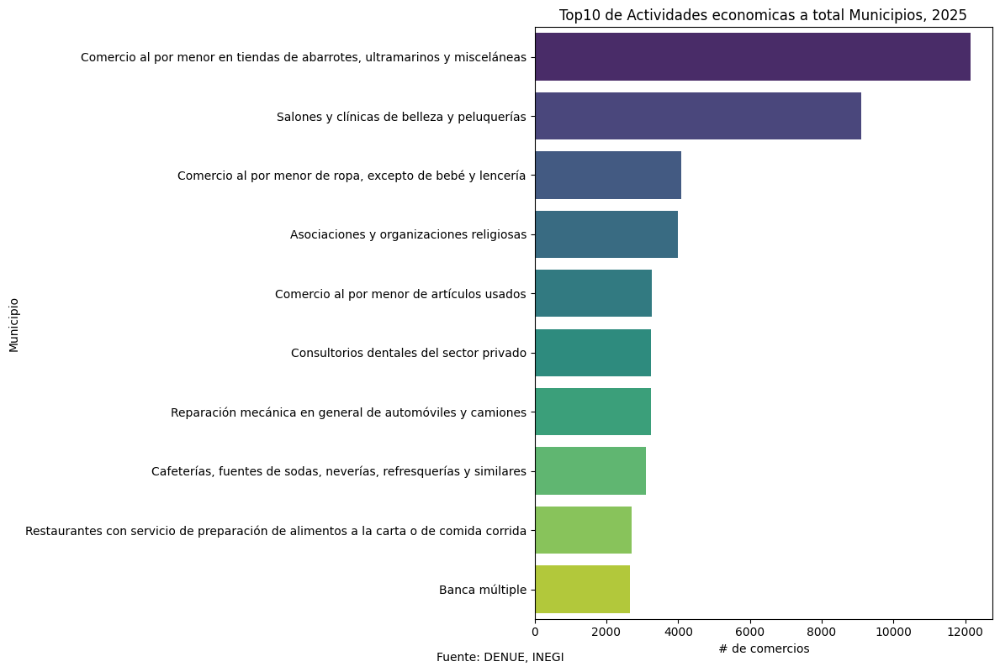

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the activities by count in descending order
prop_sorted = prop.sort_values(by='count', ascending=False)

# Select the top 10 activities (or adjust as needed)
top_n = 10
prop_top_n = prop_sorted.head(top_n)

# Create a horizontal bar plot
plt.figure(figsize=(12, 8))
# Assign the y-variable to hue and set legend=False to avoid the FutureWarning
sns.barplot(x='count', y='nombre_act', data=prop_top_n, palette='viridis', hue='nombre_act', legend=False)

# Add labels and title
plt.xlabel('# de comercios') # Swapped labels
plt.ylabel('Municipio') # Swapped labels
plt.title('Top10 de Actividades economicas a total Municipios, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)
plt.tight_layout() # Adjust layout

plt.show()

In [ ]:
# denue selecting just the top 10
top10 = denue[top10['nombre_act']]

# total colum by row
#top10["total"]= denue.sum(axis=1)
top10

nombre_act,"Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas",Salones y clínicas de belleza y peluquerías,"Comercio al por menor de ropa, excepto de bebé y lencería",Asociaciones y organizaciones religiosas,Comercio al por menor de artículos usados,Consultorios dentales del sector privado,Reparación mecánica en general de automóviles y camiones,"Cafeterías, fuentes de sodas, neverías, refresquerías y similares",Restaurantes con servicio de preparación de alimentos a la carta o de comida corrida,Banca múltiple
municipio,,,,,,,,,,
Ensenada,1477,1221,605,570,751,250,427,460,420,311
Mexicali,2238,2538,922,835,855,1050,1107,719,613,772
Playas de Rosarito,496,385,178,201,143,94,111,173,154,90
San Felipe,43,54,40,32,28,9,40,17,33,13
San Quintín,620,212,152,203,134,30,109,104,45,26
Tecate,364,258,171,182,142,88,119,92,106,69
Tijuana,6912,4435,2013,1975,1218,1729,1336,1532,1337,1379


In [ ]:
# qunatiles over data frame
prop['Quartile'] = pd.qcut(prop['count'], q=3, labels=['Q1', 'Q2', 'Q3'])
prop.head(5)

,nombre_act,count,cumperc,Quartile
249,"Comercio al por menor en tiendas de abarrotes,...",12150,8.765981,Q3
743,Salones y clínicas de belleza y peluquerías,9103,15.333612,Q3
238,"Comercio al por menor de ropa, excepto de bebé...",4081,18.277972,Q3
52,Asociaciones y organizaciones religiosas,3998,21.162448,Q3
183,Comercio al por menor de artículos usados,3271,23.522409,Q3


Text(0.5, 0.01, 'Fuente: DENUE, INEGI')

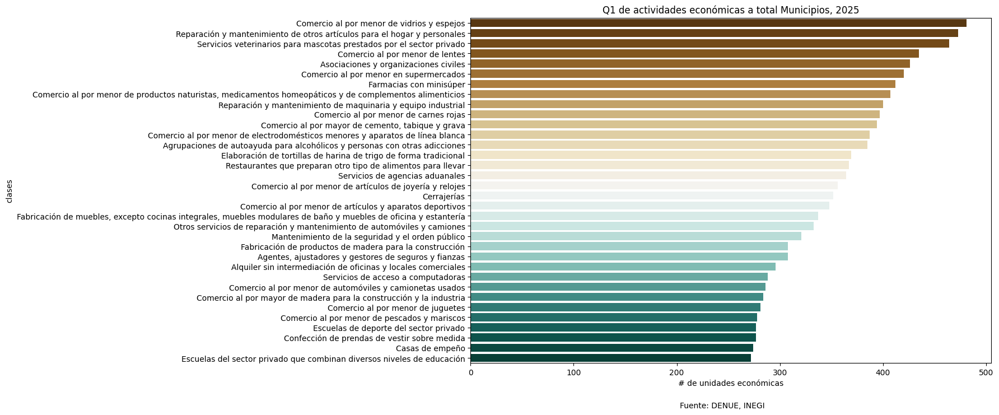

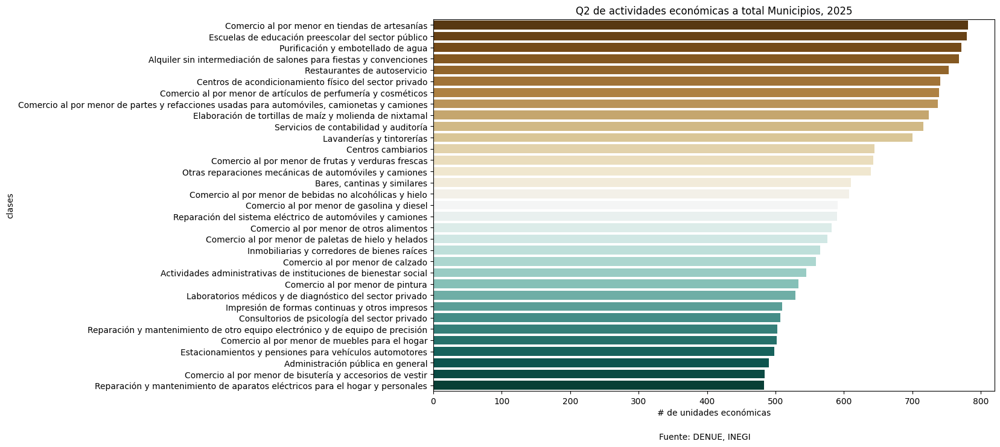

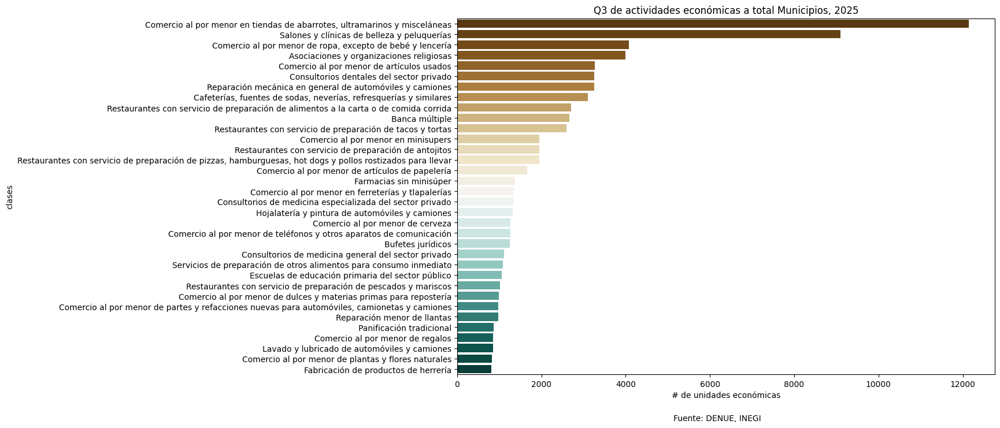

In [ ]:
# bar chart of Quartile
q1= prop[prop['Quartile'] == 'Q1']
q2= prop[prop['Quartile'] == 'Q2']
q3= prop[prop['Quartile'] == 'Q3']

# bar chart - Q1
plt.figure(figsize=(12, 8))
sns.barplot(x='count',
            y='nombre_act',
            data=q1,
            palette='BrBG',
            hue='nombre_act',
            legend=False)
plt.xlabel('# de unidades económicas') # Swapped labels
plt.ylabel('clases') # Swapped labels
plt.title('Q1 de actividades económicas a total Municipios, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)

# bar chart - Q2
plt.figure(figsize=(12, 8))
sns.barplot(x='count',
            y='nombre_act',
            data=q2,
            palette='BrBG',
            hue='nombre_act',
            legend=False)
plt.xlabel('# de unidades económicas') # Swapped labels
plt.ylabel('clases') # Swapped labels
plt.title('Q2 de actividades económicas a total Municipios, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)

# bar chart - Q3
plt.figure(figsize=(12, 8))
sns.barplot(x='count',
            y='nombre_act',
            data=q3,
            palette='BrBG',
            hue='nombre_act',
            legend=False)
plt.xlabel('# de unidades económicas') # Swapped labels
plt.ylabel('clases') # Swapped labels
plt.title('Q3 de actividades económicas a total Municipios, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)


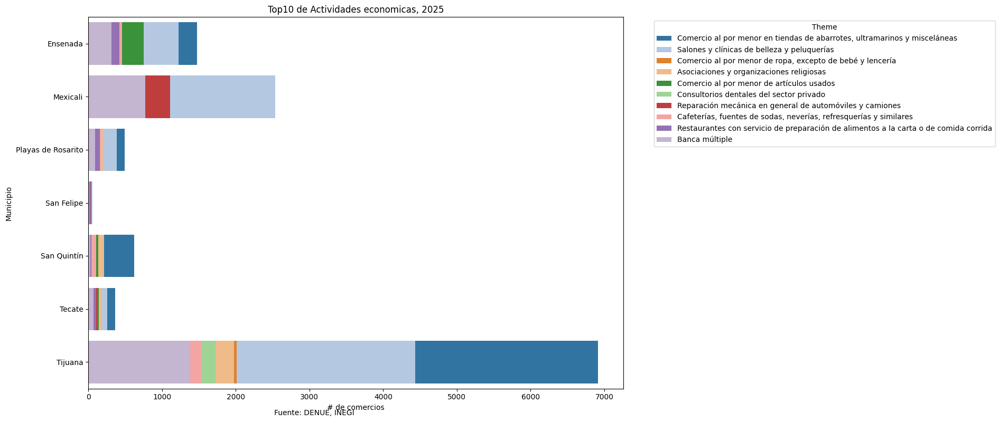

In [ ]:
# Reset the index to make 'municipio' a column
top10_reset = top10.reset_index()

# Melt the DataFrame to long format
top_melted = top10_reset.melt(id_vars='municipio', var_name='Theme', value_name='Count')

# Plot stacked bar chart horizontal
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='municipio', hue='Theme', data=top_melted, dodge=False, palette='tab20') # Swapped x and y

# Add labels and title
plt.xlabel('# de comercios') # Swapped labels
plt.ylabel('Municipio') # Swapped labels
plt.title('Top10 de Actividades economicas, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)
plt.tight_layout() # Adjust layout

# Get the current Axes
ax = plt.gca()

# Adjust legend position (might need further tuning for horizontal)
ax.legend(title='Theme', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1) # Adjusted legend position and columns for horizontal

plt.show()

Personal ocupado en Unidades Economicas

In [ ]:
# transpose nombre_act
personal= veintecinco.copy()
personal=personal.pivot_table(index='municipio', columns='per_ocu', aggfunc='size', fill_value=0)
personal

# drop columns with sum zeros
cols_to_drop = personal.columns[(personal == 0).all()].tolist()
personal.drop(columns=cols_to_drop, inplace=True)

# erase white spaces in all columns
personal.columns = personal.columns.str.strip()
#erase space in index
personal.index = personal.index.str.strip()

personal

per_ocu,0 a 5 personas,101 a 250 personas,11 a 30 personas,251 y más personas,31 a 50 personas,51 a 100 personas,6 a 10 personas
municipio,,,,,,,
Ensenada,15591,96,1221,53,233,171,1834
Mexicali,30216,230,2713,179,562,385,3938
Playas de Rosarito,5054,23,333,12,53,40,573
San Felipe,935,4,92,1,17,10,144
San Quintín,3644,6,214,4,37,16,327
Tecate,3643,43,323,29,87,69,462
Tijuana,50971,484,4581,349,1004,674,6924


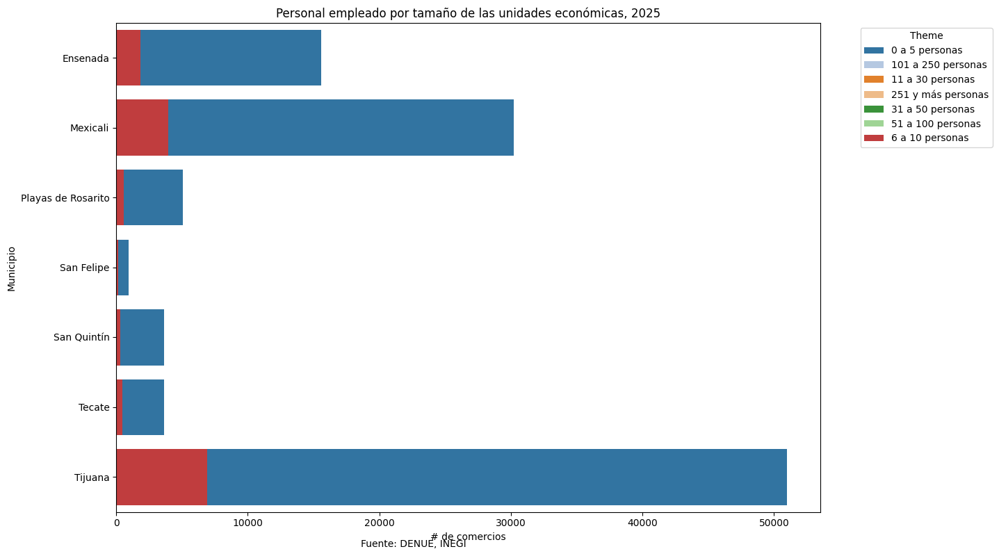

In [ ]:
# Reset the index to make 'municipio' a column
personal_reset = personal.reset_index()

# Melt the DataFrame to long format
personal_melted = personal_reset.melt(id_vars='municipio', var_name='Theme', value_name='Count')

# Plot stacked bar chart horizontal
plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='municipio', hue='Theme', data=personal_melted, dodge=False, palette='tab20') # Swapped x and y

# Add labels and title
plt.xlabel('# de comercios') # Swapped labels
plt.ylabel('Municipio') # Swapped labels
plt.title('Personal empleado por tamaño de las unidades económicas, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)
plt.tight_layout() # Adjust layout

# Get the current Axes
ax = plt.gca()

# Adjust legend position (might need further tuning for horizontal)
ax.legend(title='Theme', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1) # Adjusted legend position and columns for horizontal

plt.show()

In [ ]:
# summ each activities by percentage
prop_pp = pd.DataFrame(personal.sum()).reset_index() # Sum columns and reset index
prop_pp.columns = ['per_ocu', 'count'] # Rename columns

# qunatiles over data frame
prop_pp['Quartile'] = pd.qcut(prop_pp['count'], q=3, labels=['Q1', 'Q2', 'Q3'])
prop_pp.head(5)

# order
prop_pp = prop_pp.sort_values(by='Quartile', ascending=True)
prop_pp

,per_ocu,count,Quartile
1,101 a 250 personas,886,Q1
3,251 y más personas,627,Q1
4,31 a 50 personas,1993,Q2
5,51 a 100 personas,1365,Q2
0,0 a 5 personas,110054,Q3
2,11 a 30 personas,9477,Q3
6,6 a 10 personas,14202,Q3


Text(0.5, 0.01, 'Fuente: DENUE, INEGI')

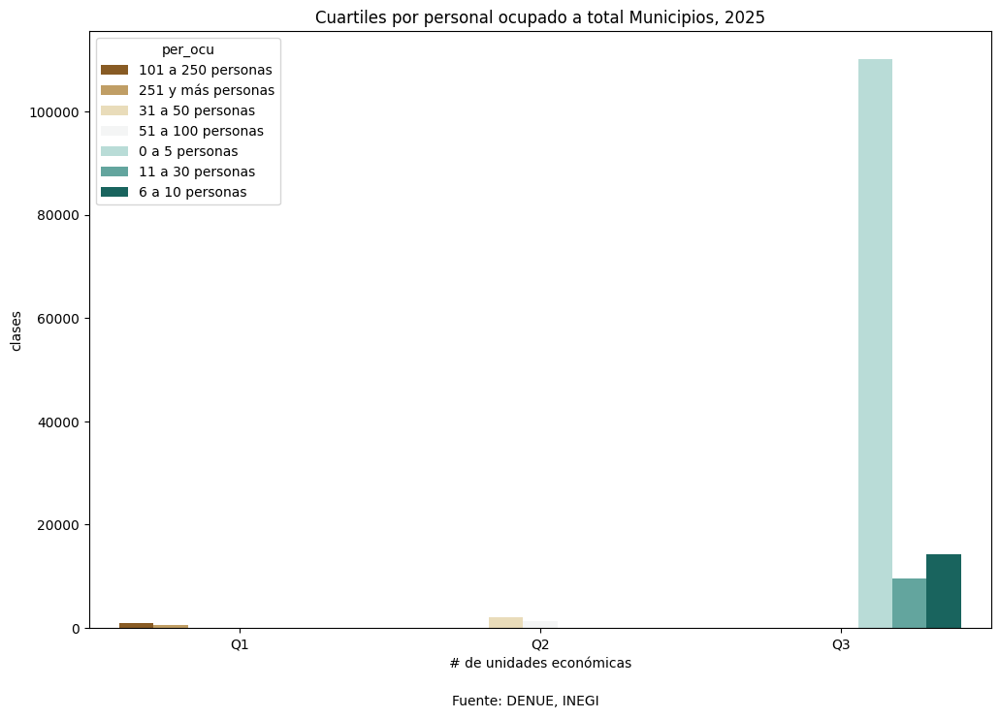

In [ ]:
# bar chart - Q1
plt.figure(figsize=(12, 8))
sns.barplot(x='Quartile',
            y='count',
            data=prop_pp,
            palette='BrBG',
            hue='per_ocu',
            legend=True)

plt.xlabel('# de unidades económicas') # Swapped labels
plt.ylabel('clases') # Swapped labels
plt.title('Cuartiles por personal ocupado a total Municipios, 2025') # Updated title
plt.figtext(0.5, 0.01, "Fuente: DENUE, INEGI", ha="center", fontsize=10)

In [ ]:
ce_mun = pd.read_csv("/content/drive/MyDrive/Proyectos/pyme_bc/Censo_Economico/SAIC_Mun_actividad.csv")

# drop the first 3 rows
ce_mun = ce_mun.iloc[3:].copy()

# Set the correct column names based on the first row
ce_mun.columns = ce_mun.iloc[0]
ce_mun = ce_mun[1:].reset_index(drop=True)

# eliminate last column (assuming it's the unnamed index column after reset_index)
if 'Unnamed: 0' in ce_mun.columns:
    ce_mun = ce_mun.drop(columns=['Unnamed: 0'])
# Check for columns that are not strings and drop them if necessary
non_string_cols = [col for col in ce_mun.columns if not isinstance(col, str)]
if non_string_cols:
    # Assuming the last column might be the problematic one if it's not a string
    if ce_mun.columns[-1] in non_string_cols:
         ce_mun = ce_mun.iloc[:, :-1]
    else:
        # If there are other non-string columns, you might need a more specific way to handle them
        # For now, let's assume the last column is the most likely issue.
        pass


# large bound of data frame: last row  minus 1
ce_mun = ce_mun.iloc[:1891].copy()

# Extract initial code from headers and rename columns
# Convert columns to strings before splitting
ce_mun.columns = ce_mun.columns.astype(str)
new_columns = [col.split(' ')[0] for col in ce_mun.columns]
ce_mun.columns = new_columns


ce_mun.tail()

In [ ]:
# count unique Actividad
ce_mun['Actividad'].nunique()

In [ ]:
ce_mun["Municipio"].unique()

In [ ]:
# Changue names
ce_mun.loc[ce_mun["Municipio"] == "001 Ensenada", "Municipio"] = "ENSD"
ce_mun.loc[ce_mun["Municipio"] == "002 Mexicali", "Municipio"] = "MEXC"
ce_mun.loc[ce_mun["Municipio"] == "003 Tecate", "Municipio"] = "TECT"
ce_mun.loc[ce_mun["Municipio"] == "004 Tijuana", "Municipio"] = "TIJ"
ce_mun.loc[ce_mun["Municipio"] == "005 Playas de Rosarito", "Municipio"] = "PRSR"
ce_mun.loc[ce_mun["Municipio"] == '006 San Quintín', "Municipio"] = "SQNT"
ce_mun.loc[ce_mun["Municipio"] == "007 San Felipe", "Municipio"] = "SNFP"

In [ ]:
# eliminate caracteres especificos in column Actividad

ce_mun['Actividad'] = ce_mun['Actividad'].str.replace('Clase', '')

ce_mun['Actividad'] = ce_mun['Actividad'].str.replace('[0-9]', '', regex=True)

# drop white space
ce_mun['Actividad'] = ce_mun['Actividad'].str.strip()

In [ ]:
# KEY with "-"
ce_mun["key"] = ce_mun["Municipio"] + "-" + ce_mun["Actividad"]
ce_mun.head(2)

In [ ]:
# omitir empresas mayores de 250 empleados
ce_mun = ce_mun[ce_mun['Estrato']!="251 y más"]

### QN2

**De cuánto fue la variaciòn observada de UE
entre 2013 y 2023**

In [ ]:
# copia
ce_bc = ce_mun.copy()
unidades_estrato = ce_bc[['Año', 'Estrato', 'Actividad', 'UE']]

**De cuánto fue la variaciòn observada de UE entre 2013 y 2023**

In [ ]:
# omit the middle year
ue_delta= unidades_estrato[unidades_estrato['Año'] != "2018"]

# transpose matrix
ue_delta = ue_delta.pivot_table(index=['Año', 'Estrato'],
                                columns='Actividad',
                                values='UE',
                                aggfunc='sum',
                                fill_value=0)

# Convert 'UE' to numeric, coercing errors
unidades_estrato.loc[:, 'UE'] = pd.to_numeric(unidades_estrato['UE'], errors='coerce')

# reseat index with integer values
ue_delta=ue_delta.reset_index()
ue_delta

Actividad,Año,Estrato,Agencias de cobranza,Agencias de publicidad,Agencias de viajes,"Agentes, ajustadores y gestores de seguros y fianzas",Agrupaciones de autoayuda para alcohólicos y personas con otras adicciones,Alineación y balanceo de automóviles y camiones,Alquiler de aparatos eléctricos y electrónicos para el hogar y personales,Alquiler de autobuses con chofer,...,Servicios de protección y custodia mediante el monitoreo de sistemas de seguridad,Servicios de recepción de llamadas telefónicas y promoción por teléfono,Servicios de revelado e impresión de fotografías,Servicios de rotulación y otros servicios de publicidad,Servicios funerarios,Servicios integrales de apoyo a los negocios en instalaciones,Servicios veterinarios para mascotas prestados por el sector privado,Sociedades financieras de objeto múltiple,Tapicería de automóviles y camiones,Transporte escolar y de personal
0,2013,0 a 10,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2013,11 a 50,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2013,51 a 250,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2023,0 a 10,21,15,136,75,198,59,30,5,...,46,16,10,8,23,10,284,36,37,0
4,2023,11 a 50,7,5,4,0,13,4,0,0,...,44,36,0,0,7,3,10,6,0,6
5,2023,51 a 250,0,0,0,0,0,0,0,0,...,7,8,0,0,4,0,0,0,0,5


In [ ]:
# Filter data for 2015 and 2025
trece = ue_delta[ue_delta['Año'] == "2013"].set_index('Estrato')
veintres = ue_delta[ue_delta['Año'] == "2023"].set_index('Estrato')

# Drop the 'año' column from the indexed DataFrames as it's no longer needed for the difference calculation
trece = trece.drop(columns='Año')
veintres = veintres.drop(columns='Año')


# Calculate the difference (2025 - 2015)
# Use align to handle potential missing municipalities in one year
ue_diff = veintres.align(trece, fill_value=0)[0] - veintres.align(trece, fill_value=0)[1]

# Get the list of count variables
count_variables = ['Agencias de cobranza',
 'Agencias de publicidad',
 'Agencias de viajes',
 'Agentes, ajustadores y gestores de seguros y fianzas',
 'Agrupaciones de autoayuda para alcohólicos y personas con otras adicciones',
 'Alineación y balanceo de automóviles y camiones',
 'Alquiler de aparatos eléctricos y electrónicos para el hogar y personales',
 'Alquiler de autobuses con chofer',
 'Alquiler de maquinaria y equipo para construcción, minería y actividades forestales',
 'Alquiler de maquinaria y equipo para mover, levantar y acomodar materiales',
 'Alquiler de mesas, sillas, vajillas y similares',
 'Alquiler de otros artículos para el hogar y personales',
 'Alquiler de prendas de vestir',
 'Alquiler sin intermediación de oficinas y locales comerciales',
 'Alquiler sin intermediación de otros bienes raíces',
 'Alquiler sin intermediación de salones para fiestas y convenciones',
 'Alquiler sin intermediación de viviendas amuebladas',
 'Alquiler sin intermediación de viviendas no amuebladas',
 'Asilos y otras residencias del sector privado para el cuidado de ancianos',
 'Asociaciones y organizaciones civiles',
 'Asociaciones y organizaciones de profesionistas',
 'Asociaciones y organizaciones laborales y sindicales',
 'Asociaciones, organizaciones y cámaras de productores, comerciantes y prestadores de servicios',
 'Autotransporte local de materiales para la construcción',
 'Bares, cantinas y similares',
 'Billares',
 'Bufetes jurídicos',
 'Cafeterías, fuentes de sodas, neverías, refresquerías y similares',
 'Campamentos y albergues recreativos',
 'Casas de empeño',
 'Casas de juegos electrónicos',
 'Centros cambiarios',
 'Centros de acondicionamiento físico del sector privado',
 'Centros generales de alquiler',
 'Centros nocturnos, discotecas y similares',
 'Cerrajerías',
 'Clubes o ligas de aficionados',
 'Clínicas de consultorios médicos del sector privado',
 'Comercio al por mayor de abarrotes',
 'Comercio al por mayor de artículos de perfumería y cosméticos',
 'Comercio al por mayor de artículos y accesorios para diseño y pintura artística',
 'Comercio al por mayor de cemento, tabique y grava',
 'Comercio al por mayor de desechos metálicos',
 'Comercio al por mayor de dulces y materias primas para repostería',
 'Comercio al por mayor de envases en general, papel y cartón para la industria',
 'Comercio al por mayor de equipo de telecomunicaciones, fotografía y cinematografía',
 'Comercio al por mayor de equipo y material eléctrico',
 'Comercio al por mayor de fertilizantes, plaguicidas y semillas para siembra',
 'Comercio al por mayor de frutas y verduras frescas',
 'Comercio al por mayor de juguetes y bicicletas',
 'Comercio al por mayor de madera para la construcción y la industria',
 'Comercio al por mayor de maquinaria y equipo agropecuario, forestal y para la pesca',
 'Comercio al por mayor de maquinaria y equipo para la industria manufacturera',
 'Comercio al por mayor de maquinaria y equipo para otros servicios y para actividades comerciales',
 'Comercio al por mayor de materiales metálicos para la construcción y la manufactura',
 'Comercio al por mayor de medicamentos veterinarios y alimentos para animales, excepto mascotas',
 'Comercio al por mayor de mobiliario y equipo de oficina',
 'Comercio al por mayor de mobiliario, equipo e instrumental médico y de laboratorio',
 'Comercio al por mayor de mobiliario, equipo, y accesorios de cómputo',
 'Comercio al por mayor de otra maquinaria y equipo de uso general',
 'Comercio al por mayor de otras materias primas para otras industrias',
 'Comercio al por mayor de otros alimentos',
 'Comercio al por mayor de otros materiales de desecho',
 'Comercio al por mayor de otros materiales para la construcción, excepto de madera y metálicos',
 'Comercio al por mayor de partes y refacciones nuevas para automóviles, camionetas y camiones',
 'Comercio al por mayor de pescados y mariscos',
 'Comercio al por mayor de productos químicos para la industria farmacéutica y para otro uso industrial',
 'Comercio al por mayor de semillas y granos alimenticios, especias y chiles secos',
 'Comercio al por menor de aceites y grasas lubricantes, aditivos y similares para vehículos de motor',
 'Comercio al por menor de alfombras, cortinas, tapices y similares',
 'Comercio al por menor de antigüedades y obras de arte',
 'Comercio al por menor de artículos de joyería y relojes',
 'Comercio al por menor de artículos de mercería y bonetería',
 'Comercio al por menor de artículos de papelería',
 'Comercio al por menor de artículos de perfumería y cosméticos',
 'Comercio al por menor de artículos ortopédicos',
 'Comercio al por menor de artículos para la limpieza',
 'Comercio al por menor de artículos religiosos',
 'Comercio al por menor de artículos usados',
 'Comercio al por menor de artículos y aparatos deportivos',
 'Comercio al por menor de automóviles y camionetas nuevos',
 'Comercio al por menor de bebidas no alcohólicas y hielo',
 'Comercio al por menor de bicicletas y triciclos',
 'Comercio al por menor de bisutería y accesorios de vestir',
 'Comercio al por menor de blancos',
 'Comercio al por menor de calzado',
 'Comercio al por menor de carne de aves',
 'Comercio al por menor de carnes rojas',
 'Comercio al por menor de cerveza',
 'Comercio al por menor de cigarros, puros y tabaco',
 'Comercio al por menor de disfraces, trajes típicos y vestidos de novia',
 'Comercio al por menor de dulces y materias primas para repostería',
 'Comercio al por menor de electrodomésticos menores y aparatos de línea blanca',
 'Comercio al por menor de equipo y material fotográfico',
 'Comercio al por menor de frutas y verduras frescas',
 'Comercio al por menor de gas L.P. en cilindros y para tanques estacionarios',
 'Comercio al por menor de gas L.P. en estaciones de carburación',
 'Comercio al por menor de gasolina y diésel',
 'Comercio al por menor de grabaciones de audio y video en medios físicos',
 'Comercio al por menor de instrumentos musicales',
 'Comercio al por menor de juguetes',
 'Comercio al por menor de leche, otros productos lácteos y embutidos',
 'Comercio al por menor de lencería',
 'Comercio al por menor de libros',
 'Comercio al por menor de llantas y cámaras para automóviles, camionetas y camiones',
 'Comercio al por menor de lámparas ornamentales y candiles',
 'Comercio al por menor de mascotas y sus accesorios',
 'Comercio al por menor de mobiliario, equipo y accesorios de cómputo',
 'Comercio al por menor de muebles para el hogar',
 'Comercio al por menor de otros alimentos',
 'Comercio al por menor de otros artículos de uso personal',
 'Comercio al por menor de otros artículos para la decoración de interiores',
 'Comercio al por menor de otros combustibles',
 'Comercio al por menor de paletas de hielo y helados',
 'Comercio al por menor de partes y refacciones nuevas para automóviles, camionetas y camiones',
 'Comercio al por menor de partes y refacciones usadas para automóviles, camionetas y camiones',
 'Comercio al por menor de pescados y mariscos',
 'Comercio al por menor de pintura',
 'Comercio al por menor de pisos y recubrimientos cerámicos',
 'Comercio al por menor de plantas y flores naturales',
 'Comercio al por menor de productos naturistas, medicamentos homeopáticos y de complementos alimenticios',
 'Comercio al por menor de regalos',
 'Comercio al por menor de ropa de bebé',
 'Comercio al por menor de ropa de cuero y piel y de otros artículos de estos materiales',
 'Comercio al por menor de ropa, excepto de bebé y lencería',
 'Comercio al por menor de semillas y granos alimenticios, especias y chiles secos',
 'Comercio al por menor de sombreros',
 'Comercio al por menor de telas',
 'Comercio al por menor de teléfonos y otros aparatos de comunicación',
 'Comercio al por menor de vidrios y espejos',
 'Comercio al por menor de vinos y licores',
 'Comercio al por menor en ferreterías y tlapalerías',
 'Comercio al por menor en minisupers',
 'Comercio al por menor en supermercados',
 'Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas',
 'Comercio al por menor en tiendas de artesanías',
 'Comercio al por menor en tiendas departamentales',
 'Confección de cortinas, blancos y similares',
 'Confección de prendas de vestir sobre medida',
 'Conservación de guisos y otros alimentos preparados por procesos distintos a la congelación',
 'Consultorios de medicina especializada del sector privado',
 'Consultorios de medicina general del sector privado',
 'Consultorios de nutriólogos y dietistas del sector privado',
 'Consultorios de optometría',
 'Consultorios de psicología del sector privado',
 'Consultorios de quiropráctica del sector privado',
 'Consultorios del sector privado de audiología y de terapia ocupacional, física y del lenguaje',
 'Consultorios dentales del sector privado',
 'Diseño gráfico',
 'Edificación de naves y plantas industriales, excepto la supervisión',
 'Edificación de vivienda unifamiliar',
 'Elaboración de derivados y fermentos lácteos',
 'Elaboración de tortillas de harina de trigo de forma tradicional',
 'Elaboración de tortillas de maíz y molienda de nixtamal',
 'Escuelas de arte del sector privado',
 'Escuelas de deporte del sector privado',
 'Escuelas de educación media superior del sector privado',
 'Escuelas de educación media técnica terminal del sector privado',
 'Escuelas de educación preescolar y centros de estimulación temprana del sector privado',
 'Escuelas de educación superior del sector privado',
 'Escuelas de idiomas del sector privado',
 'Escuelas del sector privado de educación para necesidades especiales',
 'Escuelas del sector privado dedicadas a la enseñanza de oficios',
 'Escuelas del sector privado que combinan diversos niveles de educación',
 'Estacionamientos y pensiones para vehículos automotores',
 'Fabricación de anuncios y señalamientos',
 'Fabricación de artículos y utensilios de madera para el hogar',
 'Fabricación de botellas de plástico',
 'Fabricación de cocinas integrales y muebles modulares de baño',
 'Fabricación de componentes electrónicos',
 'Fabricación de concreto',
 'Fabricación de envases de cartón',
 'Fabricación de equipo eléctrico y electrónico y sus partes para vehículos automotores',
 'Fabricación de equipo no electrónico para uso médico, dental y para laboratorio',
 'Fabricación de estructuras metálicas',
 'Fabricación de ladrillos no refractarios',
 'Fabricación de muebles, excepto cocinas integrales, muebles modulares de baño y muebles de oficina y estantería',
 'Fabricación de otros productos de cartón y papel',
 'Fabricación de otros productos de plástico de uso industrial sin reforzamiento',
 'Fabricación de preparaciones farmacéuticas',
 'Fabricación de productos de madera para la construcción',
 'Fabricación de tubos y bloques de cemento y concreto',
 'Fabricación de yeso y productos de yeso',
 'Farmacias con minisúper',
 'Farmacias sin minisúper',
 'Guarderías del sector privado',
 'Hojalatería y pintura de automóviles y camiones',
 'Hospitales del sector privado de otras especialidades médicas',
 'Hospitales psiquiátricos y para el tratamiento por adicción del sector privado',
 'Hoteles con otros servicios integrados',
 'Hoteles sin otros servicios integrados',
 'Impresión de formas continuas y otros impresos',
 'Inmobiliarias y corredores de bienes raíces',
 'Instalaciones eléctricas en construcciones',
 'Instalación de cristales y otras reparaciones a la carrocería de automóviles y camiones',
 'Intermediación de comercio al por menor, y comercio al por menor a través de catálogos impresos, televisión y similares',
 'Joyería de metales y piedras no preciosos y de otros materiales',
 'Lavado y lubricado de automóviles y camiones',
 'Lavanderías y tintorerías',
 'Moteles',
 'Notarías públicas',
 'Orfanatos y otras residencias de asistencia social del sector privado',
 'Otras instituciones de intermediación crediticia y financiera no bursátil',
 'Otras reparaciones mecánicas de automóviles y camiones',
 'Otro autotransporte foráneo de carga especializado',
 'Otro autotransporte local de carga especializado',
 'Otros consultorios del sector privado para el cuidado de la salud',
 'Otros juegos de azar',
 'Otros servicios de apoyo secretarial y similares',
 'Otros servicios de reparación y mantenimiento de automóviles y camiones',
 'Otros servicios educativos proporcionados por el sector privado',
 'Otros servicios recreativos prestados por el sector privado',
 'Otros servicios relacionados con los servicios inmobiliarios',
 'Otros servicios técnicos relacionados con la contabilidad',
 'Otros trabajos en exteriores',
 'Panificación tradicional',
 'Pensiones y casas de huéspedes',
 'Pesca y captura de otros peces, crustáceos, moluscos y otras especies',
 'Purificación y embotellado de agua',
 'Realización de trabajos de carpintería en el lugar de la construcción',
 'Rectificación de partes de motor de automóviles y camiones',
 'Recubrimientos y terminados metálicos',
 'Reparación de calzado y otros artículos de piel y cuero',
 'Reparación de suspensiones de automóviles y camiones',
 'Reparación de tapicería de muebles para el hogar',
 'Reparación de transmisiones de automóviles y camiones',
 'Reparación del sistema eléctrico y electrónico de automóviles y camiones',
 'Reparación mecánica en general de automóviles y camiones',
 'Reparación menor de llantas',
 'Reparación y mantenimiento de aparatos eléctricos para el hogar y personales',
 'Reparación y mantenimiento de bicicletas',
 'Reparación y mantenimiento de equipo electrónico de uso doméstico',
 'Reparación y mantenimiento de maquinaria y equipo agropecuario y forestal',
 'Reparación y mantenimiento de maquinaria y equipo industrial',
 'Reparación y mantenimiento de maquinaria y equipo para mover, levantar y acomodar materiales',
 'Reparación y mantenimiento de motocicletas',
 'Reparación y mantenimiento de otro equipo electrónico y de equipo de precisión',
 'Reparación y mantenimiento de otros artículos para el hogar y personales',
 'Residencias del sector privado con cuidados de enfermeras para enfermos convalecientes, en rehabilitación, incurables y terminales',
 'Residencias del sector privado para el cuidado de personas con problemas de retardo mental',
 'Residencias del sector privado para el cuidado de personas con problemas de trastorno mental y adicción',
 'Restaurantes con servicio de preparación de alimentos a la carta o de comida corrida',
 'Restaurantes con servicio de preparación de antojitos',
 'Restaurantes con servicio de preparación de pescados y mariscos',
 'Restaurantes con servicio de preparación de pizzas, hamburguesas, hot dogs y pollos rostizados para llevar',
 'Restaurantes con servicio de preparación de tacos y tortas',
 'Restaurantes de autoservicio',
 'Restaurantes que preparan otro tipo de alimentos para llevar',
 'Salones y clínicas de belleza y peluquerías',
 'Sanitarios públicos y bolerías',
 'Servicios de acceso a computadoras',
 'Servicios de administración de bienes raíces',
 'Servicios de administración de negocios',
 'Servicios de agencias aduanales',
 'Servicios de ambulancias',
 'Servicios de apoyo para efectuar trámites legales',
 'Servicios de arquitectura',
 'Servicios de casetas telefónicas',
 'Servicios de comedor para empresas e instituciones',
 'Servicios de consultoría en administración',
 'Servicios de consultoría en medio ambiente',
 'Servicios de contabilidad y auditoría',
 'Servicios de control y exterminación de plagas',
 'Servicios de dibujo',
 'Servicios de diseño de sistemas de cómputo y servicios relacionados',
 'Servicios de elaboración de mapas',
 'Servicios de fotografía y videograbación',
 'Servicios de grúa',
 'Servicios de ingeniería',
 'Servicios de investigación y de protección y custodia, excepto mediante monitoreo',
 'Servicios de laboratorios de pruebas',
 'Servicios de orientación y trabajo social para la niñez y la juventud prestados por el sector privado',
 'Servicios de preparación de alimentos para ocasiones especiales',
 'Servicios de preparación de documentos',
 'Servicios de preparación de otros alimentos para consumo inmediato',
 'Servicios de profesores particulares',
 'Servicios de protección y custodia mediante el monitoreo de sistemas de seguridad',
 'Servicios de recepción de llamadas telefónicas y promoción por teléfono',
 'Servicios de revelado e impresión de fotografías',
 'Servicios de rotulación y otros servicios de publicidad',
 'Servicios funerarios',
 'Servicios integrales de apoyo a los negocios en instalaciones',
 'Servicios veterinarios para mascotas prestados por el sector privado',
 'Sociedades financieras de objeto múltiple',
 'Tapicería de automóviles y camiones',
 'Transporte escolar y de personal' ]

# Find the biggest absolute changes
biggest_changes = ue_diff[count_variables].stack()

In [ ]:
# drop zero values in column 0
biggest_changes = biggest_changes[biggest_changes != 0]

In [ ]:
# biggest_changes to data frame
biggest_changes.to_excel('biggest_changes.xlsx')

### QN3

**De qué manera se puede comprender la estructura económica de las empresas**

Medidas calculadas de variable observada por numero de unidad económicas regsitradas por sector

In [ ]:
# Convert relevant columns to numeric, coercing errors
numeric_cols = ['A111A', 'UE', 'A131A', 'A211A', 'A511A', 'H001A', 'H001B', 'H001C', 'H001D',
                'H000A', 'H000B', 'H000C', 'H000D', 'H010A', 'H010B', 'H010C', 'H010D',
                'H203B', 'H020A', 'H020D', 'I200A', 'I200B', 'I200C', 'I200D', 'J000A',
                'J300A', 'J400A', 'J500A', 'A700A', 'A800A']

for col in numeric_cols:
    ce_bc[col] = pd.to_numeric(ce_bc[col], errors='coerce')

# Now perform the calculations
# produccion bruta total
ce_bc["prod_brut_ue"]= ce_bc['A111A']/ce_bc['UE']

# valor agregado censal bruto
ce_bc["vacb_ue"] = ce_bc['A131A']/ce_bc['UE']

# inversion
ce_bc["inv_ue"] = ce_bc["A211A"] /ce_bc['UE']

# Margen por reventa de mercancías
ce_bc["margen_ue"] = ce_bc["A511A"]/ce_bc['UE']

# Personal ocupado total
ce_bc["pers_ocup_ue"] = ce_bc["H001A"]/ce_bc['UE']

# Personal ocupado total, hombres
ce_bc["persh_ocup_ue"] = ce_bc["H001B"]/ce_bc['UE']

# Personal ocupado total, mujeres
ce_bc["persm_ocup_ue"] = ce_bc["H001C"]/ce_bc['UE']

# horas trabajas por personal ocupado
ce_bc["hrs_ocup_ue"] = ce_bc["H001D"]/ce_bc['UE']

# Personal dependiente de la razón social
ce_bc["pers_dep_ue"] = ce_bc["H000A"]/ce_bc['UE']

# Personal dependiente de la razón social, hombres
ce_bc["persh_dep_ue"] = ce_bc["H000B"]/ce_bc['UE']

# Personal dependiente de la razón social, mujeres
ce_bc["persm_dep_ue"] = ce_bc["H000C"]/ce_bc['UE']

# Horas trabajadas por personal dependiente de la razón social
ce_bc["hrs_dep_pers_ue"] = ce_bc["H000D"]/ce_bc['UE']

# personal remunerado
ce_bc["pers_rem_ue"] = ce_bc["H010A"]/ce_bc['UE']

# Personal remunerado, hombres
ce_bc["persh_rem_ue"]= ce_bc["H010B"]/ce_bc['UE']

# Personal remunerado, mujeres
ce_bc["persm_rem_ue"]= ce_bc["H010C"]/ce_bc['UE']

# Horas trabajadas por personal remunerado
ce_bc["hrs_rem_ue"]= ce_bc["H010D"]/ce_bc['UE']

# Personal administrativo, contable y de dirección, hombres
ce_bc["AdConDir_homb_ue"]= ce_bc["H203B"]/ce_bc['UE']

# Personal administrativo, contable y de dirección, mujeres
ce_bc["AdConDir_muj_ue"]= ce_bc["H203B"]/ce_bc['UE']

# Propietarios, familiares y otros trabajadores no remunerados
ce_bc["pers_no_rem_ue"]= ce_bc["H020A"]/ce_bc['UE']

# Horas trabajadas por propietarios, familiares y otros trabajadores no remunerados
ce_bc["hrs_no_rem_ue"]= ce_bc["H020D"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base
ce_bc["pers_s/sueldo_ue"]= ce_bc["I200A"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base, hombres
ce_bc["persh_s/sueldo_ue"] = ce_bc["I200B"]/ce_bc['UE']

# Personal por honorarios o comisiones sin sueldo base, mujeres
ce_bc["persm_s/sueldo_ue"] = ce_bc["I200C"]/ce_bc['UE']

# Horas trabajadas por personal por honorarios o comisiones sin sueldo base
ce_bc["hrs_s/sueldo_ue"] = ce_bc["I200D"]/ce_bc['UE']

# Remuneraciones
ce_bc["remuneracion_ue"] = ce_bc["J000A"]/ce_bc['UE']

# Contribuciones patronales a regímenes de seguridad social
ce_bc["contribucion_ue"] = ce_bc["J300A"]/ce_bc['UE']

# otras prestaciones socials
ce_bc["otras_prest_ue"] = ce_bc["J400A"]/ce_bc['UE']

# Utilidades repartidas a los trabajadores
ce_bc["utilidad_ue"] = ce_bc["J500A"]/ce_bc['UE']

# total de gastos
ce_bc["gastos_ue"] = ce_bc["A700A"]/ce_bc['UE']

# total ingresos
ce_bc["ingresos_ue"] = ce_bc["A800A"]/ce_bc['UE']

# rentabilidad calculated
ce_bc["rentabilidad"] = (ce_bc["A800A"] - ce_bc["A700A"])/ce_bc['UE']

Tendencias en formato grafico

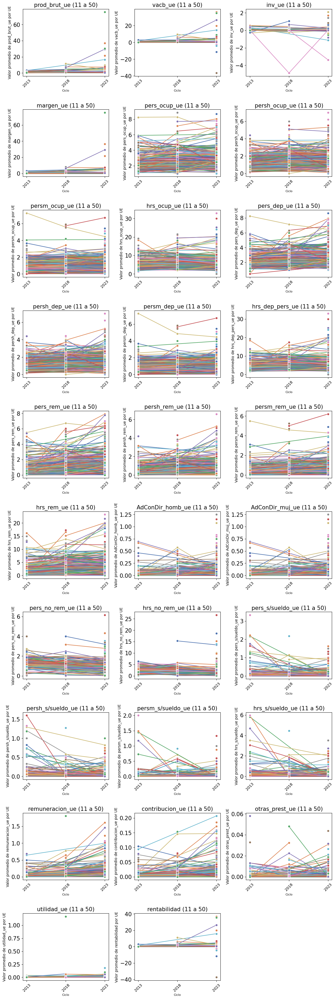

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#####  PRINTING FORMAT #######

# sort ascendig in ce_bc_micro by Año
ce_bc = ce_bc.sort_values(by='Año')

ce_bc_micro = ce_bc[(ce_bc['Estrato']== "0 a 10")].drop(columns=['Estrato']) # "0 a 10", "11 a 50", "51 a 250"

# list of variables
relevant_cols = ["prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
                    "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
                    "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
                    "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                    "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]

# mini charts in grid
n_cols = 3 # Number of columns in the grid
n_rows = (len(relevant_cols) + n_cols - 1) // n_cols # Calculate number of rows based on the number of variables and columns

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5)) # Adjust figure size

axes = axes.flatten() # Flatten the axes array for easy iteration

for i, col in enumerate(relevant_cols):
    # Plot all variables in relevant_cols, as the grid size is calculated based on the number of variables
    sns.lineplot(data=ce_bc_micro,
                 x='Año',
                 y=col,
                 hue='key', # Use the new column with shorter names for hue
                 marker='o',
                 palette="deep",
                 ax=axes[i],
                 legend=False) # Remove individual subplot legends

    axes[i].set_title(f'{col} (11 a 50)', fontsize=15) # Set title for each subplot
    axes[i].set_xlabel('Ciclo', fontsize=8) # Set xlabel for each subplot
    axes[i].set_ylabel(f'Valor promedio de {col} por UE', fontsize=10) # Set ylabel for each subplot
    axes[i].tick_params(axis='x', rotation=45, labelsize=10) # Rotate x-axis labels and adjust font size
    axes[i].tick_params(axis='y', labelsize=15) # Adjust y-axis label font size


# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.subplots_adjust(hspace=0.5, wspace=0.3, bottom=0.15) # Adjust spacing to make space for the legend at the bottom
plt.show()

# legend name at the end of each line



Medidas de tendencia central

In [ ]:
# Select the relevant columns using a list of column names, including 'Actividad'
#listado_ce_bc = ce_bc[["Año", "Estrato","Actividad", "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue","pers_ocup_ue","persh_ocup_ue", "persm_ocup_ue",
#                    "hrs_ocup_ue","pers_dep_ue","persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue", "pers_rem_ue",
#                    "persh_rem_ue","persm_rem_ue", "hrs_rem_ue","AdConDir_homb_ue", "AdConDir_muj_ue", "pers_no_rem_ue",
#                    "hrs_no_rem_ue", "pers_s/sueldo_ue", "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
#                    "remuneracion_ue", "contribucion_ue","otras_prest_ue", "utilidad_ue", "gastos_ue", "ingresos_ue", "rentabilidad"]]

# filter by size, wrapping each condition in parentheses
#listado_ce_bc = ce_bc_micro[(ce_bc_micro['Estrato']== "0 a 10")].drop(columns=['Estrato'])

In [ ]:
# descriptive by each list in ce_bc_micro

# Unidades
ce_bc_unidad= ce_bc[(ce_bc['Estrato']== "0 a 10")].drop(columns=['Estrato']) # "0 a 10", "11 a 50", "51 a 250",


#####

ocupacion = ["pers_ocup_ue", "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
            "pers_dep_ue", "persh_dep_ue", "persm_dep_ue", "hrs_dep_pers_ue",
            "hrs_rem_ue", "AdConDir_homb_ue", "AdConDir_muj_ue",
            "hrs_no_rem_ue", "hrs_s/sueldo_ue"]

remuneracion = ["pers_rem_ue", "persh_rem_ue","persm_rem_ue", "pers_s/sueldo_ue",
                "persh_s/sueldo_ue", "persm_s/sueldo_ue", "pers_no_rem_ue"]



empresa = ["prod_brut_ue","vacb_ue","inv_ue","margen_ue",
          "remuneracion_ue", "contribucion_ue", "otras_prest_ue", "utilidad_ue", "rentabilidad"]

# Group descriptive statistics by 'Actividad' for 'ocupacion' variables without NaN
descriptive_ocupacion = ce_bc_unidad.groupby('Actividad')[ocupacion].agg(['median', "std","max", "min"]).round(3).fillna(0)

# Group descriptive statistics by 'Actividad' for 'remuneracion' variables
descriptive_remuneracion = ce_bc_unidad.groupby('Actividad')[remuneracion].agg(['median', "std", "max", "min"]).round(3).fillna(0)

# Group descriptive statistics by 'Actividad' for 'empresa' variables, fill NAN with zeros
descriptive_empresa = ce_bc_unidad.groupby('Actividad')[empresa].agg(['median', "std","max", "min"]).round(3).fillna(0)

# export tables to excel

descriptive_ocupacion.to_excel('ocupacio.xlsx')
descriptive_remuneracion.to_excel('remuneracion.xlsx')
descriptive_empresa.to_excel('empresa.xlsx')

### QN4

**De qué manera los sectores tienen similitudes entre ellos para el último ciclo censado**

#### PCA-Micro

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_micro= ce_bc.loc[:, ["Año","Estrato", "key",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_micro = cluster_23_micro[(cluster_23_micro['Año']== "2023")].drop(columns=['Año'])

cluster_23_micro = cluster_23_micro[(cluster_23_micro['Estrato']== "0 a 10")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_micro = cluster_23_micro.set_index('key')

PCA para reducir dimensionalidad

In [ ]:
# # Tratamiento de dato
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Gráficos
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import style

# Preprocesado y modelado
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale


In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_micro)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_micro.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,2.177892e-01,1.860207e-01,1.413506e-02,1.762865e-01,2.520960e-01,1.958106e-01,3.130129e-01,0.251737,0.196642,0.310423,...,0.346457,-0.125925,-0.031751,2.993205e-02,1.497336e-03,2.186856e-02,3.056249e-01,1.717159e-01,2.065413e-01,1.802990e-01
PC2,-3.175364e-01,-3.258344e-01,7.462787e-02,-3.331724e-01,-1.286469e-01,3.735443e-01,1.985223e-01,-0.124589,0.375834,0.203684,...,0.122247,0.137410,0.174913,-3.632274e-02,3.626466e-02,-5.464741e-03,-2.177034e-02,2.175165e-02,-8.292733e-02,-3.253434e-01
PC3,-2.381779e-01,-2.885831e-01,5.917241e-02,-2.577480e-01,4.021309e-01,-2.992801e-01,1.024867e-01,0.406220,-0.293299,0.104226,...,0.044405,0.088482,0.123311,4.341193e-02,-7.852212e-02,-8.373542e-03,5.821964e-03,9.808787e-02,3.280240e-02,-2.891418e-01
PC4,1.221278e-02,-2.032412e-02,1.240158e-02,-8.160783e-02,5.489388e-02,3.601962e-02,2.814537e-03,-0.010964,-0.026229,-0.058429,...,-0.021676,-0.062902,-0.075122,5.537936e-01,5.239583e-01,6.248520e-01,-2.054065e-02,-2.942207e-02,5.632074e-03,-3.147987e-02
PC5,1.207301e-01,2.022708e-01,-9.225144e-02,1.260830e-01,8.328971e-02,1.357893e-02,2.074655e-01,0.079155,0.007164,0.202492,...,-0.100032,0.553157,0.586619,5.423568e-02,5.178728e-02,6.620491e-02,-1.145744e-01,-1.839052e-01,-1.406375e-01,2.089368e-01
PC6,1.652546e-01,-8.533753e-02,6.983289e-01,2.335737e-01,-9.066047e-02,-1.257646e-02,-2.289003e-02,-0.082808,-0.018719,-0.019129,...,-0.091704,0.141752,0.133014,-3.917594e-02,8.333049e-02,2.436212e-02,-3.744877e-02,5.213853e-01,2.134165e-01,-1.070429e-01
PC7,-6.232600e-02,1.389240e-01,6.799034e-01,-6.073348e-02,8.405541e-02,5.715519e-03,1.439004e-02,0.091486,0.015202,0.022872,...,0.083595,-0.099652,-0.110509,2.906440e-03,-4.637303e-02,-1.904163e-02,-6.046870e-02,-5.032756e-01,-4.129131e-01,1.342865e-01
PC8,-1.620705e-01,1.583207e-01,1.615152e-01,-2.826454e-01,-5.424603e-02,-1.961460e-02,1.314019e-02,-0.069361,-0.005804,0.010295,...,-0.015177,0.031531,0.048622,9.003774e-02,-1.322476e-01,-4.997948e-03,-3.821055e-02,-3.543896e-01,8.089910e-01,1.342286e-01
PC9,-1.461027e-01,5.772255e-02,-1.879808e-04,-6.644784e-02,-7.648302e-03,2.345265e-02,-9.789195e-03,0.064114,-0.065625,-0.010084,...,0.005003,0.043098,-0.029254,-6.224160e-01,7.166444e-01,-5.053988e-02,1.475503e-01,-8.565789e-02,8.548204e-02,7.572442e-02
PC10,-1.655118e-01,1.857794e-01,3.176230e-02,-2.233785e-01,2.390790e-01,2.354806e-01,-3.449354e-01,0.226299,0.240633,-0.350039,...,-0.312516,0.363680,-0.109787,8.969631e-02,-6.058903e-02,-6.162006e-02,2.270595e-01,2.186461e-01,-4.655248e-02,1.949670e-01


In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum() *100
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[ 32.26449923  47.08784638  58.8914382   70.0295259   80.17463988
  85.02075419  89.09235792  91.92514534  94.30712267  95.90165456
  97.42663787  98.8786247   99.2391855   99.53154414  99.79531117
  99.9830646   99.9942379   99.9997522   99.99999458 100.
 100.         100.        ]


In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[6]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_micro.columns)

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
inv_ue,0.679903
vacb_ue,0.138924
rentabilidad,0.134287
persh_rem_ue,0.115061
persh_dep_ue,0.091486
persh_ocup_ue,0.084055
hrs_rem_ue,0.083595
persm_rem_ue,0.063757
hrs_dep_pers_ue,0.022872
persm_dep_ue,0.015202


In [ ]:
# new cluster_23_micro

cluster_23_micro = cluster_23_micro[["inv_ue", "vacb_ue", "rentabilidad","persh_rem_ue", "otras_prest_ue"]]

#### Hierarchical analysis-Micro

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

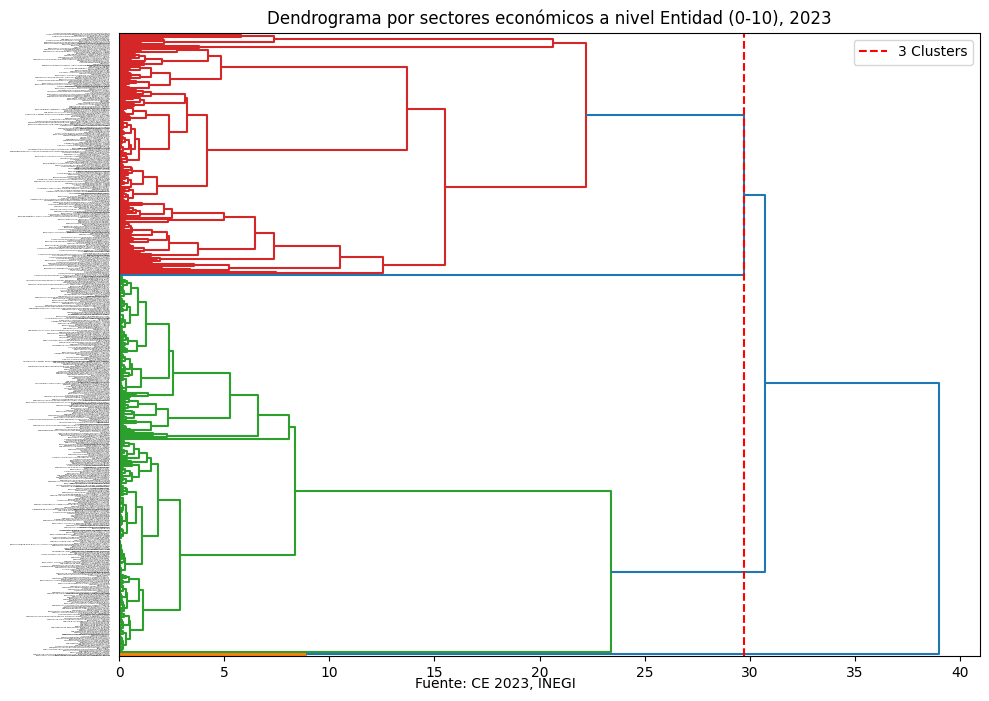


Descripción estadistica por cada cluster:


,inv_ue,vacb_ue,rentabilidad,persh_rem_ue,otras_prest_ue
Hierarchical_Cluster,,,,,
1,-0.070,29.496,29.688,2.905,0.007
2,0.005,0.377,0.373,0.451,0.000
3,0.028,1.304,1.240,1.865,0.004


In [ ]:
# Automatic clusterization

from scipy.cluster.hierarchy import *
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import numpy as np


# escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_23_micro)

linked_data = linkage(X_scaled, method='ward', metric='euclidean')


plt.figure(figsize=(10, 7))
plt.title("Dendrograma por sectores económicos a nivel Entidad (0-10), 2023")
dendrogram(linked_data,
           labels=cluster_23_micro.index,
           leaf_rotation=0,
           leaf_font_size=1,
           orientation="right",
           #truncate_mode='lastp', p=80,
           )

plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)
plt.tight_layout()

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_micro['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_micro = cluster_23_micro.sort_values(by='Hierarchical_Cluster')
cluster_23_micro.head(3)

# export data
cluster_23_micro.to_excel('cluster_23_micro_mun.xlsx')

# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_micro.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

Metricas de evaluación

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_micro)
Z = linkage(cluster_23_micro, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_micro, cluster_23_micro['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_micro, cluster_23_micro['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.73
Davies-Bouldin Score: 0.78
Calinski-Harabasz Score: 465.90


#### PCA-Pequeno

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_pequeno= ce_bc.loc[:, ["Año","Estrato", "key",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_pequeno = cluster_23_pequeno[(cluster_23_pequeno['Año']== "2023")].drop(columns=['Año'])

cluster_23_pequeno = cluster_23_pequeno[(cluster_23_pequeno['Estrato']== "11 a 50")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_pequeno = cluster_23_pequeno.set_index('key')

PCA para reducir dimensionalidad

In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_pequeno)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_pequeno.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,2.982817e-01,2.942650e-01,9.520971e-02,2.645681e-01,2.964592e-01,-5.853233e-02,2.283559e-01,0.303357,-0.054604,0.234115,...,0.251422,-0.160327,-0.142296,-6.521766e-02,-9.616358e-02,-8.909646e-02,2.806743e-01,1.975660e-01,1.458334e-01,2.875978e-01
PC2,1.141183e-02,2.313235e-02,3.007762e-02,2.464377e-02,-1.884367e-01,4.715423e-01,2.700534e-01,-0.187233,0.471892,0.266563,...,0.264521,-0.047647,-0.013610,-1.595101e-02,7.603705e-02,3.173966e-02,5.275839e-02,2.463713e-02,8.081727e-03,1.888560e-02
PC3,3.036959e-01,3.463245e-01,1.919633e-01,3.417343e-01,-1.631202e-01,5.447014e-02,-2.375914e-01,-0.195512,0.025861,-0.270176,...,-0.264708,0.028056,-0.009390,2.467695e-01,2.629817e-01,2.714099e-01,1.598847e-02,5.467758e-02,9.210123e-02,3.350964e-01
PC4,-6.320912e-02,-1.093375e-01,-5.751650e-02,-1.544861e-01,2.264304e-01,-1.606250e-02,2.096898e-01,0.163548,-0.053886,0.145947,...,0.128922,0.073183,0.101092,5.015770e-01,4.357049e-01,5.439519e-01,2.528385e-02,-1.552086e-02,-6.592896e-02,-1.069418e-01
PC5,8.660157e-02,1.086476e-01,2.621526e-02,1.048823e-01,1.374758e-02,-1.297146e-02,1.313356e-01,0.026755,-0.004686,0.141548,...,0.040188,0.650096,0.677049,-9.581749e-02,-9.061277e-02,-7.653726e-02,-5.498177e-02,3.368810e-02,-4.448587e-02,1.073535e-01
PC6,-1.228720e-01,-2.633782e-02,-5.442143e-01,-7.110232e-02,-1.465323e-02,3.522081e-02,-7.023029e-02,-0.012655,0.039408,-0.065988,...,-0.071385,0.066867,0.043649,3.918827e-02,1.103514e-02,1.616464e-02,2.174594e-02,5.426476e-01,6.004014e-01,1.772661e-02
PC7,5.132186e-03,-2.084062e-01,7.519532e-01,-1.741802e-01,2.778353e-02,2.865616e-02,-6.656401e-02,0.040040,0.033967,-0.058188,...,-0.065833,0.075612,0.058185,-4.417891e-02,4.455975e-02,-1.060907e-02,1.760299e-01,2.984500e-01,3.503026e-01,-2.943709e-01
PC8,4.324052e-02,7.968435e-03,1.096942e-01,6.959318e-02,-1.626714e-01,-1.836948e-01,2.235896e-01,-0.164283,-0.178933,0.222828,...,0.220290,-0.117050,-0.005706,2.312562e-02,-1.590293e-02,4.658556e-02,-4.006470e-01,-3.815649e-01,5.830803e-01,1.152118e-02
PC9,-7.209734e-02,-8.798895e-03,9.538193e-02,1.075414e-01,-2.536461e-01,-2.222346e-01,1.828587e-01,-0.250494,-0.214950,0.186980,...,0.186401,-0.166877,-0.015370,2.486016e-02,-1.235573e-02,4.800526e-02,-1.355942e-01,6.113723e-01,-3.626677e-01,-2.800054e-02
PC10,-3.945950e-02,2.454326e-03,-1.115425e-01,-3.640280e-02,-1.558984e-01,-6.836747e-02,5.591803e-02,-0.095857,-0.150572,0.047082,...,0.037668,-0.032149,0.059374,-5.152546e-01,6.132464e-01,-2.564200e-02,4.702234e-01,-1.317502e-01,4.020066e-02,-1.146159e-03


In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum() *100
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)


------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[ 29.9596498   48.35592139  60.46811691  71.38924165  79.43791501
  83.99190781  88.05072179  91.70099056  94.33852287  96.41660718
  98.26241365  99.12960682  99.50810005  99.72628357  99.86738162
  99.92037164  99.95862241  99.98983946  99.99918494 100.
 100.         100.        ]


In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[7]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_pequeno.columns)

# ABS values
pc3_loadings_series = pc3_loadings_series.abs()

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
utilidad_ue,0.583080
contribucion_ue,0.400647
otras_prest_ue,0.381565
hrs_ocup_ue,0.223590
hrs_dep_pers_ue,0.222828
hrs_rem_ue,0.220290
persm_ocup_ue,0.183695
persm_dep_ue,0.178933
persm_rem_ue,0.168786
persh_dep_ue,0.164283


In [ ]:
# new cluster_23_mediano

cluster_23_pequeno = cluster_23_pequeno[["utilidad_ue", "hrs_ocup_ue", "hrs_dep_pers_ue", "hrs_rem_ue", "persm_ocup_ue",
                                         ]]

#### Hierarchical analysis-Pequeno

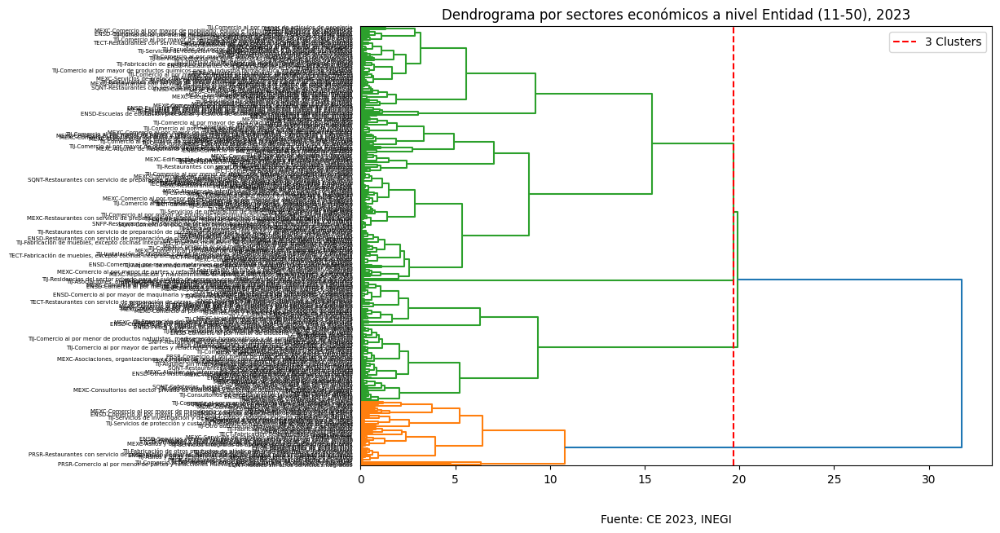


Descripción estadistica por cada cluster:


,utilidad_ue,hrs_ocup_ue,hrs_dep_pers_ue,hrs_rem_ue,persm_ocup_ue
Hierarchical_Cluster,,,,,
1,0.099,76.675,75.859,74.781,10.190
2,0.030,31.495,30.286,28.487,6.865
3,0.098,48.326,47.318,45.888,8.268


In [ ]:
# Automatic clusterization

# Automatic clusterization

from scipy.cluster.hierarchy import *
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import numpy as np


# escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_23_pequeno)

linked_data = linkage(X_scaled, method='ward', metric='euclidean')


plt.figure(figsize=(10, 7))
plt.title("Dendrograma por sectores económicos a nivel Entidad (11-50), 2023")
dendrogram(linked_data,
           labels=cluster_23_pequeno.index,
           leaf_rotation=0,
           orientation="right")
plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_pequeno['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_pequeno = cluster_23_pequeno.sort_values(by='Hierarchical_Cluster')

# EXPORT
cluster_23_pequeno.to_excel('cluster_23_pequeno_mun.xlsx')

# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_pequeno.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_pequeno)
Z = linkage(cluster_23_pequeno, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_pequeno, cluster_23_pequeno['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_pequeno, cluster_23_pequeno['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.69
Davies-Bouldin Score: 0.64
Calinski-Harabasz Score: 409.87


#### PCA-Mediano

In [ ]:
# mantendremos solo las variables agregadas
cluster_23_mediano= ce_bc.loc[:, ["Año","Estrato", "key",
                                "prod_brut_ue","vacb_ue", "inv_ue", "margen_ue",
                                "persh_ocup_ue", "persm_ocup_ue","hrs_ocup_ue",
                                "persh_dep_ue","persm_dep_ue","hrs_dep_pers_ue",
                                "persh_rem_ue","persm_rem_ue", "hrs_rem_ue",
                                "pers_no_rem_ue","hrs_no_rem_ue",
                                "persh_s/sueldo_ue", "persm_s/sueldo_ue","hrs_s/sueldo_ue",
                                "contribucion_ue","otras_prest_ue", "utilidad_ue", "rentabilidad"]]

# eliminar columnas
cluster_23_mediano = cluster_23_mediano[(cluster_23_mediano['Año']== "2023")].drop(columns=['Año'])

cluster_23_mediano = cluster_23_mediano[(cluster_23_mediano['Estrato']== "51 a 250")].drop(columns=['Estrato'])

# convert Actividad to index
cluster_23_mediano = cluster_23_mediano.set_index('key')

PCA para reducir dimensionalidad

In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(cluster_23_mediano)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

# componentes principales
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = cluster_23_mediano.columns,
    index   = [f'PC{i+1}' for i in range(modelo_pca.components_.shape[0])] # Updated index to match the number of components
)

,prod_brut_ue,vacb_ue,inv_ue,margen_ue,persh_ocup_ue,persm_ocup_ue,hrs_ocup_ue,persh_dep_ue,persm_dep_ue,hrs_dep_pers_ue,...,hrs_rem_ue,pers_no_rem_ue,hrs_no_rem_ue,persh_s/sueldo_ue,persm_s/sueldo_ue,hrs_s/sueldo_ue,contribucion_ue,otras_prest_ue,utilidad_ue,rentabilidad
PC1,2.173008e-01,2.543573e-01,9.270919e-02,6.702927e-02,2.600515e-01,1.547812e-01,3.437759e-01,0.266335,0.165193,0.353464,...,0.353610,-0.080369,-0.014448,-1.072834e-01,-1.175607e-01,-1.206330e-01,2.386682e-01,1.892300e-01,1.154000e-01,2.552869e-01
PC2,-1.467258e-01,-9.094181e-02,-8.811629e-02,-1.448994e-01,-2.837159e-01,4.202417e-01,1.121317e-01,-0.285683,0.410248,0.105338,...,0.105680,-0.134184,-0.033165,1.486260e-01,1.794624e-01,1.768956e-01,7.210601e-02,1.777730e-01,2.223015e-02,-8.636430e-02
PC3,3.190301e-01,3.275164e-01,1.226527e-01,2.604281e-01,-1.440598e-02,1.585925e-03,-8.281381e-02,-0.038605,-0.035643,-0.113450,...,-0.115351,0.127929,0.184300,3.893615e-01,4.033195e-01,4.146612e-01,7.997855e-02,-7.824315e-03,1.661156e-01,3.137112e-01
PC4,1.982676e-01,2.533749e-01,1.220600e-01,1.298829e-01,-2.700034e-01,2.250952e-02,-2.207733e-01,-0.247213,0.052883,-0.196835,...,-0.195801,-0.025820,-0.100051,-3.067348e-01,-3.289100e-01,-3.242349e-01,7.442957e-02,2.139179e-01,3.470153e-01,2.182821e-01
PC5,-1.789616e-01,-1.029712e-01,2.987545e-01,2.941454e-01,-4.685487e-02,1.109137e-01,6.418844e-02,-0.031835,0.126870,0.073552,...,0.066973,0.472378,0.637299,-1.682017e-01,-1.061838e-01,-8.152425e-02,-8.996905e-02,-1.648093e-01,2.356879e-02,-9.407113e-02
PC6,-2.014240e-01,-2.517484e-01,5.066202e-01,1.248736e-01,3.545638e-04,-1.265243e-01,3.795759e-02,0.002982,-0.127616,0.043331,...,0.044192,-0.273602,-0.083448,1.020339e-01,7.720933e-02,6.758176e-02,3.762943e-01,4.732487e-02,4.726907e-01,-3.190135e-01
PC7,3.750308e-02,5.497102e-02,-7.716396e-02,5.192491e-01,-1.672995e-01,-7.002469e-02,2.113668e-01,-0.182384,-0.078164,0.193638,...,0.193811,-0.492008,-0.016862,6.127401e-03,-5.354592e-02,-3.854312e-02,-2.710777e-01,-3.991736e-01,-9.280177e-02,6.203224e-02
PC8,1.421077e-01,6.390606e-02,7.420600e-01,-1.409584e-01,-2.570121e-02,4.014700e-02,-2.664638e-03,-0.013641,0.037678,0.012428,...,0.014861,-0.031629,-0.235758,1.357581e-02,6.463355e-02,-1.248756e-02,-4.244061e-01,1.277790e-01,-3.765272e-01,7.703171e-03
PC9,-3.040952e-01,-1.829281e-02,-1.471749e-01,4.456596e-01,7.894113e-02,2.321952e-02,-1.926088e-02,0.107903,0.044485,0.027890,...,0.031757,0.276925,-0.374661,1.969377e-01,-1.466932e-02,-1.041469e-02,-4.422750e-01,3.597131e-01,2.609953e-01,-4.848708e-02
PC10,-5.864897e-02,1.470434e-02,-9.466987e-02,-3.755461e-02,-3.494049e-02,-1.724198e-01,5.669400e-02,-0.040308,-0.176089,0.044764,...,0.039547,-0.321814,0.505465,-9.431628e-02,6.008488e-02,7.479237e-02,-1.912163e-01,6.836850e-01,-7.445751e-02,-1.196485e-02


In [ ]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum() *100
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[ 27.09992496  47.17719512  59.58070021  70.39531365  77.29934543
  82.92552042  87.81575054  90.78420659  93.2267928   95.34740104
  97.03536306  98.08203972  98.89358024  99.4605697   99.74058048
  99.90098269  99.99472978  99.99909549  99.99985121 100.
 100.         100.        ]


In [ ]:
# Extract loadings for PC3
pc3_loadings = modelo_pca.components_[5]

# Create a Series with variable names as index and loadings as values
pc3_loadings_series = pd.Series(pc3_loadings, index=cluster_23_mediano.columns)

# Sort loadings by absolute value to find the main variables
pc3_loadings_series.sort_values(ascending=False)

,0
inv_ue,0.506620
utilidad_ue,0.472691
contribucion_ue,0.376294
margen_ue,0.124874
persh_s/sueldo_ue,0.102034
persm_s/sueldo_ue,0.077209
hrs_s/sueldo_ue,0.067582
otras_prest_ue,0.047325
hrs_rem_ue,0.044192
hrs_dep_pers_ue,0.043331


In [ ]:
# new cluster_23_mediano

cluster_23_mediano = cluster_23_mediano[["inv_ue", "utilidad_ue", "contribucion_ue", "margen_ue", "persh_s/sueldo_ue",
                                         "rentabilidad", "pers_no_rem_ue", "vacb_ue", "prod_brut_ue", "persm_dep_ue"
                                         ]]

#### Hierarchical analysis-Mediano

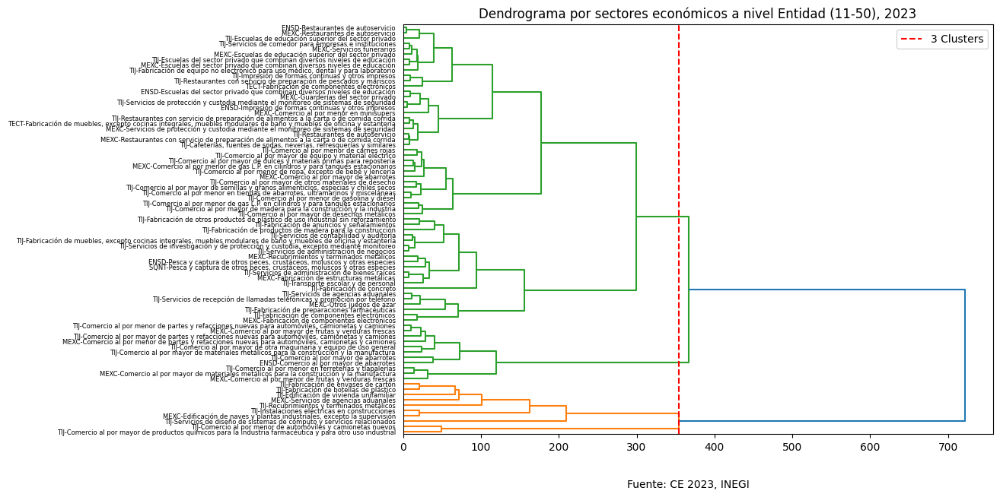


Descripción estadistica por cada cluster:


,inv_ue,utilidad_ue,contribucion_ue,margen_ue,persh_s/sueldo_ue,rentabilidad,pers_no_rem_ue,vacb_ue,prod_brut_ue,persm_dep_ue
Hierarchical_Cluster,,,,,,,,,,
1,4.977,0.917,2.778,38.504,0.550,97.584,0.178,110.217,199.868,37.970
2,0.905,0.637,2.049,77.698,0.027,60.329,0.275,61.610,81.212,25.662
3,1.462,0.422,2.020,9.387,0.498,31.667,0.265,32.720,51.774,36.928


In [ ]:
# Automatic clusterization

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt
import numpy as np

linked_data = linkage(cluster_23_mediano, method='ward', metric='euclidean')

plt.figure(figsize=(10, 7))

plt.title("Dendrograma por sectores económicos a nivel Entidad (11-50), 2023")
dendrogram(linked_data,
           labels=cluster_23_mediano.index,
           leaf_rotation=0,
           orientation="right")
plt.figtext(0.5, 0.01, "Fuente: CE 2023, INEGI", ha="center", fontsize=10)

# Add a horizontal line to show where the cut for 4 clusters would be
# You might need to adjust the y-coordinate (t) based on the dendrogram structure
plt.axvline(x=linked_data[-3, 2], color='r', linestyle='--', label='3 Clusters') # Adjusted index for 4 clusters
plt.legend()

plt.show()

# assign the cluster into data frame
cluster_23_mediano['Hierarchical_Cluster'] = fcluster(linked_data, t=linked_data[-3, 2], criterion='distance')
cluster_23_mediano = cluster_23_mediano.sort_values(by='Hierarchical_Cluster')


# EXPORT
cluster_23_mediano.to_excel('cluster_23_mediano_mun.xlsx')


# Analyze the characteristics of each hierarchical cluster
print("\nDescripción estadistica por cada cluster:")
display(cluster_23_mediano.groupby('Hierarchical_Cluster').mean().round(3)) # Calculate mean for each cluster

In [ ]:
# cophenet, near to 1 (excellent)
Y = pdist(cluster_23_mediano)
Z = linkage(cluster_23_mediano, method='ward')
c, coph_dists = cophenet(Z, Y)
print(f"Cophenetic correlation coefficient: {c:.2f}")

# davies bouldin, below to 1 (high consistency of groups)
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(cluster_23_mediano, cluster_23_mediano['Hierarchical_Cluster'])
print(f"Davies-Bouldin Score: {db_score:.2f}")

# calisnski-harabasz ()
from sklearn.metrics import calinski_harabasz_score
ch_score = calinski_harabasz_score(cluster_23_mediano, cluster_23_mediano['Hierarchical_Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.2f}")

Cophenetic correlation coefficient: 0.81
Davies-Bouldin Score: 0.90
Calinski-Harabasz Score: 52.98


### QN5

**Qué tipo de atributos muestran un impacto positivo en la VACB**

Se considera variable Target el VACB y las variables features toda las demas. Se consideran los sectores omo observaciones independientes en el tiempo, segmentado por los niveles de estratos correspondientes

#### Micro

In [ ]:
ce_bc_rfr_micro=ce_bc[["Estrato","key",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A", "H000A", "H000D", "H020A", "H020D"]]

ce_bc_rfr_micro = ce_bc_rfr_micro[(ce_bc_rfr_micro['Estrato']== '0 a 10')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_micro = ce_bc_rfr_micro.set_index('key')

Factor Analysis

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#!pip install factor_analyzer

In [ ]:
import pandas as pd
from factor_analyzer import FactorAnalyzer
import matplotlib.pyplot as plt
import numpy as np # Import numpy

# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=10, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_micro.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_micro.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
               0         1         2         3         4         5         6  \
O020A  0.034723  0.192109  0.113145  0.246460  0.057578 -0.004601 -0.006545   
H001D  0.202761  0.869651  0.203562  0.226503  0.300411  0.072446  0.039487   
H101A  0.416101  0.386321  0.160587  0.332827  0.703079  0.131811  0.069031   
H101D  0.460388  0.436291  0.119068  0.270784  0.662325  0.151711  0.065469   
H203A  0.134899  0.272736  0.248995  0.864213  0.246991  0.068789  0.046909   
H203D  0.137470  0.363579  0.202920  0.816720  0.277384  0.109001  0.050114   
I000A  0.091130  0.131400  0.953094  0.161093  0.077464  0.151250  0.028664   
I000D  0.090377  0.138265  0.948286  0.126527  0.079463  0.199324  0.026880   
I100A  0.076852  0.034568  0.068577  0.029132  0.020898  0.989390  0.012483   
I100D  0.073108  0.036977  0.068216  0.018079  0.041684  0.958382  0.013079   
I200A  0.079250  0.128584  0.966869  0.160128  0.075707 -0.030262  0.027122   
J010A  0.580813  0.281138  0.17324

In [ ]:
# select the 4th column in loading
loadings.iloc[:,9].abs().sort_values(ascending=False)

,9
K090A,0.577479
K010A,0.466132
K096A,0.414284
Q010A,0.257304
J400A,0.243276
K820A,0.234865
K311A,0.182456
Q020A,0.148051
J300A,0.121073
K910A,0.109864


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_micro = ce_bc_rfr_micro[["A131A",
                                   "K090A","K010A", "K096A","Q010A", "J400A","K820A", "K311A", "Q020A","J300A","K910A","K950A" ]]

https://towardsdatascience.com/understanding-random-forest-using-python-scikit-learn/

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import tree

In [ ]:
# Define features and target

X = ce_bc_rfr_micro.drop(columns="A131A")
y = ce_bc_rfr_micro["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.655


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': np.int64(9), 'max_features': 'log2', 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 194}
Best R^2 score from Randomized Search: 0.764


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 85]


,feature,importance,cumulative_percentage
1,J010A,0.151399,36.236685
2,J300A,0.076601,54.570661
9,J500A,0.060143,68.965531
7,J203A,0.050907,81.149882


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las micro empresas, son:
* Salarios al personal de producción, ventas y servicios
* Contribuciones patronales a regímenes de seguridad social
* Utilidades repartidas a los trabajadores
* Sueldos al personal administrativo, contable y de dirección




#### Pequeno

In [ ]:
ce_bc_rfr_pequeno=ce_bc[["Estrato","key",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A", "H000A", "H000D", "H020A", "H020D"]]

ce_bc_rfr_pequeno = ce_bc_rfr_pequeno[(ce_bc_rfr_pequeno['Estrato']== '11 a 50')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_pequeno = ce_bc_rfr_pequeno.set_index('key')

Factor Analysis

In [ ]:
# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=12, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_pequeno.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_pequeno.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
              0         1         2         3         4         5         6   \
O020A  0.060148  0.004599  0.000582  0.003935 -0.003060  0.894132  0.021169   
H001D  0.870862  0.364671  0.172218  0.158925  0.056806  0.005807  0.094086   
H101A  0.948435  0.054990  0.200991  0.115620  0.048777  0.010467  0.097638   
H101D  0.949746  0.072415  0.180446  0.100110  0.048392 -0.002099  0.090839   
H203A  0.646602  0.075769  0.066069  0.352681  0.071347  0.131925  0.151879   
H203D  0.700400  0.107531  0.056477  0.354328  0.071992  0.100651  0.139660   
I000A  0.068215  0.979065  0.083283  0.152991  0.040394 -0.001223  0.036095   
I000D  0.077046  0.980355  0.079559  0.144330  0.039032 -0.003800  0.032376   
I100A  0.054088  0.991168  0.083122  0.044985  0.041265 -0.001939  0.034343   
I100D  0.058648  0.991254  0.081079  0.044852  0.039731 -0.004391  0.031726   
I200A  0.139979  0.152123  0.022605  0.962391  0.002975  0.005618  0.024274   
J010A  0.854120 -0.036669  0.38719

In [ ]:
# select the 4th column in loading
loadings.iloc[:,11].abs().sort_values(ascending=False)

,11
H203A,0.512589
J203A,0.509472
H203D,0.417765
K060A,0.221650
J300A,0.182196
J400A,0.162924
J010A,0.150236
K820A,0.149849
K096A,0.113898
K620A,0.113344


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_pequeno = ce_bc_rfr_pequeno[["A131A",
                                       "H203A","J203A","H203D", "K060A","J300A","J400A","J010A","K820A","K096A", "K620A"]]

In [ ]:
# Define features and target

X = ce_bc_rfr_pequeno.drop(columns="A131A")
y = ce_bc_rfr_pequeno["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.609


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions = param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 277}
Best R^2 score from Randomized Search: 0.722


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 90]


,feature,importance,cumulative_percentage
4,J300A,0.036870,28.672778
6,J010A,0.028443,50.792421
8,K096A,0.022545,68.324789
7,K820A,0.017893,82.239539


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las pequeñas empresas, son:
* Contribuciones patronales a regímenes de seguridad social
* Salarios al personal de producción, ventas y servicios
* Fletes de productos vendidos
* Gastos por servicios de comunicación


#### Mediano

In [ ]:
ce_bc_rfr_mediano=ce_bc[["Estrato","key",
                  "A131A","O020A","H001D",
                  "H101A","H101D","H203A","H203D","I000A","I000D",
                  "I100A","I100D","I200A","J010A","I200D","J203A","J300A","J400A",
                  "J500A","J600A","K010A","K020A","K030A","K311A",
                  "K050A","K610A","K620A","K060A","K070A","K810A","K820A",
                  "K910A","K950A","K096A","K976A","K090A","Q010A","Q020A","Q030A",
                  "Q400A","Q900A"]]

ce_bc_rfr_mediano = ce_bc_rfr_mediano[(ce_bc_rfr_mediano['Estrato']== '51 a 250')].drop(columns=['Estrato'])

# convert Actividad to index
ce_bc_rfr_mediano = ce_bc_rfr_mediano.set_index('key')

Factor Analysis

In [ ]:
# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=20, rotation="varimax") # Example: 5 factors, varimax rotation
fa.fit(ce_bc_rfr_mediano.drop(columns="A131A"))

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=ce_bc_rfr_mediano.drop(columns="A131A").columns)
print("Factor Loadings:\n", loadings)

# Get cumulative variance
cumulative_variance = fa.get_factor_variance()[2] # Index 2 is cumulative variance

print("\nCumulative Variance Explained by Factors:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"Factor {i+1}: {cum_var:.4f}")

Factor Loadings:
              0         1         2         3         4         5         6   \
O020A -0.035743 -0.040457 -0.014891 -0.024239 -0.032196  0.100416 -0.013500   
H001D  0.786160  0.476943  0.108296  0.244472 -0.004791  0.094116  0.033469   
H101A  0.921334 -0.027446  0.062320  0.195121  0.005187  0.119975  0.077975   
H101D  0.909347 -0.014386  0.041259  0.244775 -0.093820  0.084799  0.048758   
H203A  0.482835 -0.146738  0.399525  0.110770  0.696544  0.080419  0.041172   
H203D  0.468189 -0.143898  0.415659  0.180574  0.681165  0.024789  0.025826   
I000A -0.015250  0.991203  0.077397  0.045277 -0.024737  0.045412 -0.009121   
I000D -0.016584  0.992579  0.040560  0.045858 -0.032977  0.043737 -0.017608   
I100A -0.020568  0.993841 -0.032386  0.036435 -0.037515  0.049439 -0.012112   
I100D -0.019198  0.993103 -0.030917  0.035988 -0.040902  0.047560 -0.020723   
I200A  0.046714  0.008821  0.976604  0.080051  0.113192 -0.034431  0.026349   
J010A  0.892084 -0.124142  0.01448

In [ ]:
# select the 4th column in loading
loadings.iloc[:,20].abs().sort_values(ascending=False)

,20
K820A,0.314698
J600A,0.156207
J300A,0.124319
J010A,0.113896
H101D,0.103249
I200D,0.091044
H001D,0.085621
I200A,0.075887
K950A,0.072510
J203A,0.048090


In [ ]:
# new cluster_23_mediano
ce_bc_rfr_mediano = ce_bc_rfr_mediano[["A131A",
                                        "Q400A","Q020A", "K976A", "J203A", "J300A", "J500A", "J010A"]]


In [ ]:
# Define features and target

X = ce_bc_rfr_mediano.drop(columns="A131A")
y = ce_bc_rfr_mediano["A131A"]

# Train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size = 0.25)

# Train baseline Random Forest

reg = RandomForestRegressor(
    n_estimators=100,        # number of trees
    max_features=1/3,        # fraction of features considered at each split
    oob_score=True,          # enables out-of-bag evaluation
    random_state=0)

reg.fit(X_train, y_train)

print(f"Baseline OOB score: {reg.oob_score_:.3f}")


Baseline OOB score: 0.524


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a parameter distribution for Randomized Search
param_distributions = {
    'n_estimators': randint(100, 500), # Random integers between 100 and 500
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(randint(5, 30).rvs(10)), # None or random integers between 5 and 30
    'min_samples_split': randint(2, 20), # Random integers between 2 and 20
    'min_samples_leaf': randint(1, 10) # Random integers between 1 and 10
}

# Initialize the model
rf = RandomForestRegressor(random_state=0, oob_score=True)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions = param_distributions,
    n_iter=100,       # Number of parameter settings that are sampled
    cv=5,             # 5-fold cross-validation
    scoring='r2',     # evaluation metric
    n_jobs=-1,        # use all available CPU cores
    random_state=0
)

# Perform the random search
random_search.fit(X_train, y_train)

print(f"Best parameters from Randomized Search: {random_search.best_params_}")
print(f"Best R^2 score from Randomized Search: {random_search.best_score_:.3f}")


Best parameters from Randomized Search: {'max_depth': np.int64(15), 'max_features': 'log2', 'min_samples_leaf': 6, 'min_samples_split': 3, 'n_estimators': 144}
Best R^2 score from Randomized Search: 0.525


In [ ]:
perm_importance = permutation_importance(random_search, X_test, y_test, n_repeats=10, random_state=0)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# data frame
perm_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})

perm_importance_df= perm_importance_df.sort_values('importance', ascending=False)
perm_importance_df['cumulative_percentage'] = perm_importance_df['importance'].cumsum() / perm_importance_df['importance'].sum() * 100

# select <=80 of cumulative_percentage
perm_importance_df[perm_importance_df['cumulative_percentage'] <= 95]


,feature,importance,cumulative_percentage
1,J500A,0.130494,33.193017
5,H101D,0.122392,64.325071
4,J203A,0.093066,87.997797


De acuerdo con los resultados, las variables que presentan una mayor influencia al VACB en el estrato de las pequeñas empresas, son:
* Utilidades repartidas a los trabajadores
* Horas trabajadas por personal de producción, ventas y servicios
* Sueldos al personal administrativo, contable y de dirección
